In [2]:
import sys
import os
import time
import numpy as np
import pandas as pd
import umap

print('NOVA_HOME is at', os.getenv('NOVA_HOME'))
sys.path.insert(1, os.getenv('NOVA_HOME'))
%load_ext autoreload
%autoreload 2

from src.common.utils import load_config_file
from src.embeddings.embeddings_utils import load_embeddings
from visualizations import *
from utils import summarize_times, merge_batches_by_key, correlate_columns

NOVA_HOME is at /home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load embeddings and labels

In [2]:
## Load batch 9 umap1
config_path_data = 'manuscript/manuscript_figures_data_config_80pct/newNeuronsD8FigureConfig_UMAP1_B9'
output_folder_path = '/home/projects/hornsteinlab/Collaboration/NOVA/outputs/vit_models/finetunedModel_MLPHead_acrossBatches_B56789_80pct_frozen'
config_data = load_config_file(config_path_data, 'data')
config_data.OUTPUTS_FOLDER = output_folder_path

embeddings, labels, paths = load_embeddings(output_folder_path, config_data)
labels = [s.split('_', 1)[0] if '_' in s else s for s in labels]

2025-07-31 11:23:05 INFO: [newNeuronsD8FigureConfig_UMAP1_B9] Init (log path: /home/projects/hornsteinlab/Collaboration/NOVA/outputs/vit_models/finetunedModel_MLPHead_acrossBatches_B56789_80pct_frozen/logs/310725_112305_355795_723989_galavir_sysdashboardsysjupyter.log; JOBID: 723989 Username: galavir) JOBNAME: sysdashboardsysjupyter
2025-07-31 11:23:05 INFO: [newNeuronsD8FigureConfig_UMAP1_B9] NOVA_HOME=/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA, NOVA_DATA_HOME=/home/projects/hornsteinlab/Collaboration/NOVA/input
2025-07-31 11:23:05 INFO: [load_embeddings] experiment_type = neuronsDay8_new_CLEAN
2025-07-31 11:23:05 INFO: [load_embeddings] input_folders = ['batch9']
2025-07-31 11:23:05 INFO: [load_embeddings] model_output_folder = /home/projects/hornsteinlab/Collaboration/NOVA/outputs/vit_models/finetunedModel_MLPHead_acrossBatches_B56789_80pct_frozen
2025-07-31 11:23:34 INFO: [embeddings_utils._filter] markers_to_exclude = ['CD41']
2025-07-31 11:23:42 INFO: [embeddings_uti

### Load distances and clean label for clear visualization

In [3]:
df = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP1_B9_euclidean_detailed:False.csv')
for col in ['label1','label2']:
    df[col] = df[col].str.split(pat='_', n=1).str[0]

In [273]:
df

,label1,label2,block_size,total_pairs,dist_time_s,stats_time_s,p50
0,ANXA11,ANXA11,3071,4713985,0.095507,0.010397,0.591702
1,ANXA11,CLTC,3071,19565341,0.000964,0.002397,0.817852
2,ANXA11,Calreticulin,3071,20403724,0.000759,0.002438,0.909104
3,ANXA11,DAPI,3071,193595840,0.001228,0.022026,1.067759
4,ANXA11,DCP1A,3071,20965717,0.000929,0.002503,0.886376
...,...,...,...,...,...,...,...
430,TOMM20,Tubulin,5271,31457328,0.005623,0.003332,0.751270
431,TOMM20,mitotracker,5271,27815067,0.000812,0.002985,0.817384
432,Tubulin,Tubulin,5968,17805528,0.021730,0.002307,0.506859
433,Tubulin,mitotracker,5968,31493136,0.000793,0.003267,0.796839


In [274]:
summarize_times(df)  ## Approx run time is Total dist_time_s + Total stats_time_s

Max dist_time_s:   0.371s
Total dist_time_s: 2.657s
Mean dist_time_s: 0.006s
Max stats_time_s:  0.236s
Total stats_time_s:3.666s
Mean stats_time: 0.008s


In [275]:
## Load distances calculated with more statistics

In [276]:
df = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP1_B9_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df[col] = df[col].str.split(pat='_', n=1).str[0]

In [277]:
df ## When detailed:True more statistics are calculated

,label1,label2,block_size,total_pairs,dist_time_s,stats_time_s,p5,p10,p25,p50,p75,p90,p95,lower_whisker,upper_whisker
0,ANXA11,ANXA11,3071,4713985,0.081689,0.062415,0.393329,0.429983,0.499990,0.591702,0.697070,0.798619,0.859730,0.204370,0.992690
1,ANXA11,CLTC,3071,19565341,0.010012,0.471030,0.679525,0.707355,0.757179,0.817852,0.881633,0.939887,0.975436,0.570497,1.068314
2,ANXA11,Calreticulin,3071,20403724,0.001989,0.528248,0.794656,0.821079,0.863632,0.909104,0.953718,0.995312,1.022292,0.728503,1.088847
3,ANXA11,DAPI,3071,193595840,0.006846,4.444259,0.965059,0.987980,1.024955,1.067759,1.113970,1.157091,1.182280,0.891431,1.247494
4,ANXA11,DCP1A,3071,20965717,0.008053,0.550683,0.729927,0.766814,0.826225,0.886376,0.944993,1.001384,1.038418,0.648073,1.123144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430,TOMM20,Tubulin,5271,31457328,0.004007,0.768205,0.582171,0.619214,0.681871,0.751271,0.818071,0.874533,0.906778,0.477571,1.022371
431,TOMM20,mitotracker,5271,27815067,0.001835,0.711481,0.681019,0.715796,0.766910,0.817384,0.865275,0.908640,0.935575,0.619364,1.012821
432,Tubulin,Tubulin,5968,17805528,0.039008,0.451457,0.344070,0.375719,0.434291,0.506859,0.583979,0.653445,0.694520,0.209758,0.808512
433,Tubulin,mitotracker,5968,31493136,0.001970,0.747374,0.616305,0.656065,0.722193,0.796839,0.872333,0.937772,0.974660,0.496982,1.097544


In [278]:
summarize_times(df) ## This is much faster when not calculating more stats 

Max dist_time_s:   0.572s
Total dist_time_s: 3.804s
Mean dist_time_s: 0.009s
Max stats_time_s:  70.131s
Total stats_time_s:456.615s
Mean stats_time: 1.050s


### Box plot per label

Marker: ANXA11


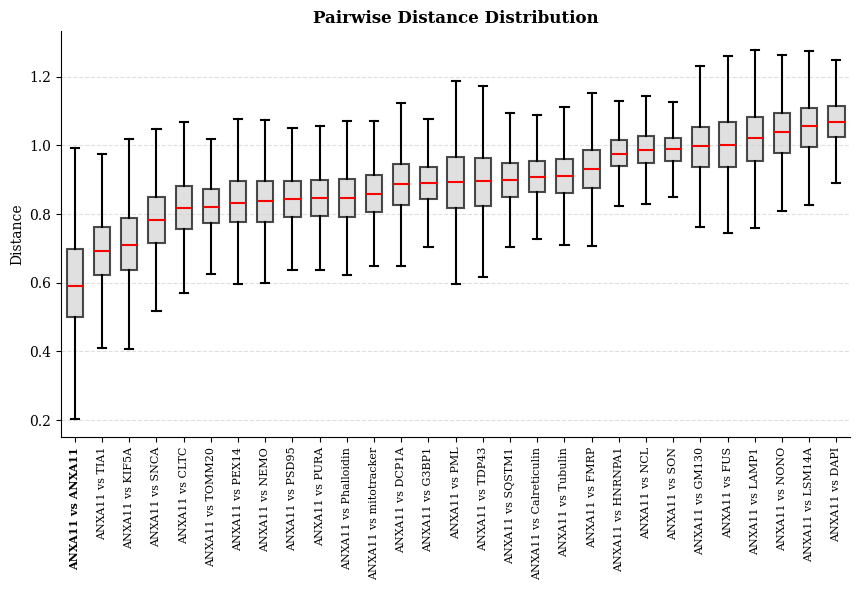

Marker: CLTC


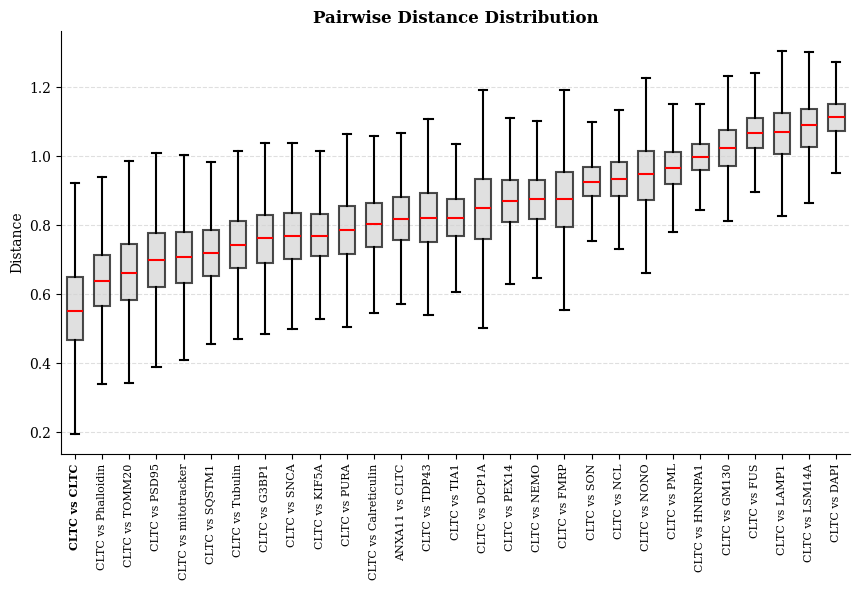

Marker: Calreticulin


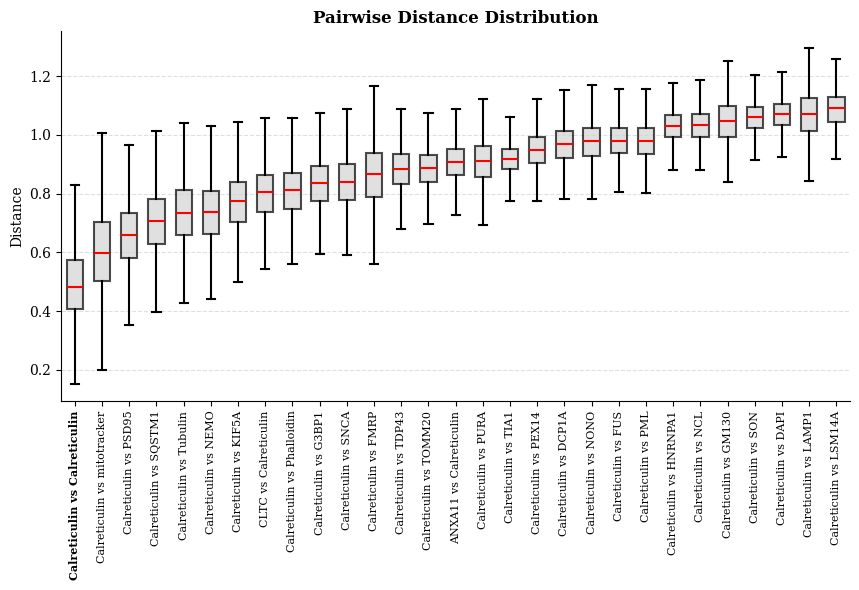

Marker: DAPI


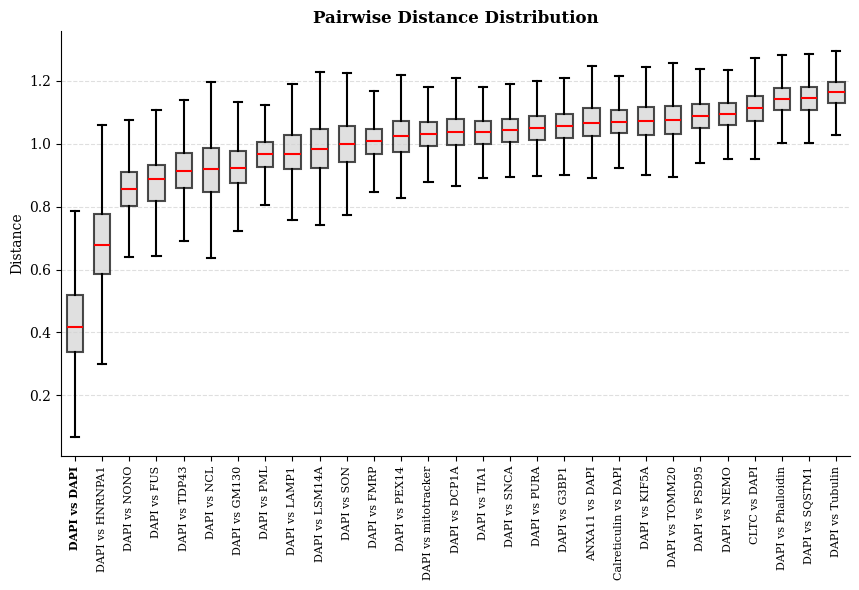

Marker: DCP1A


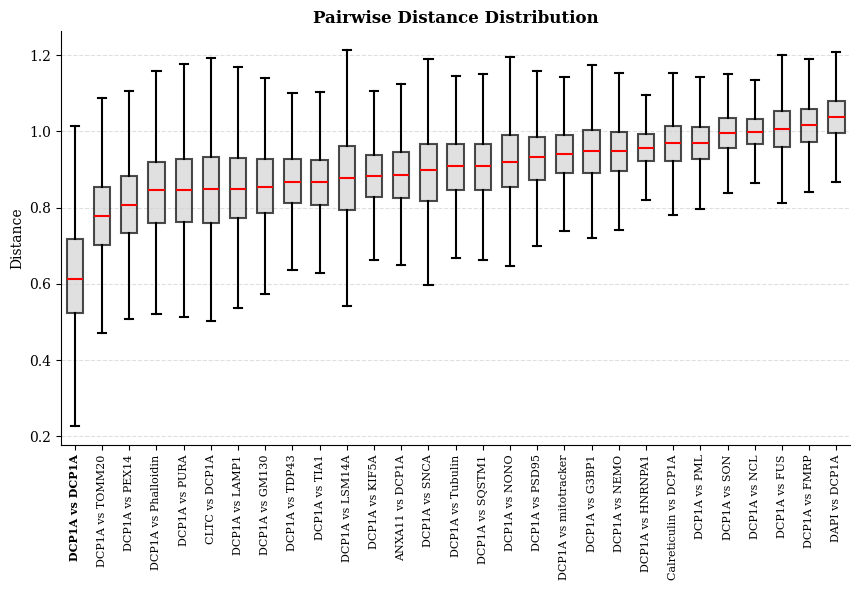

Marker: FMRP


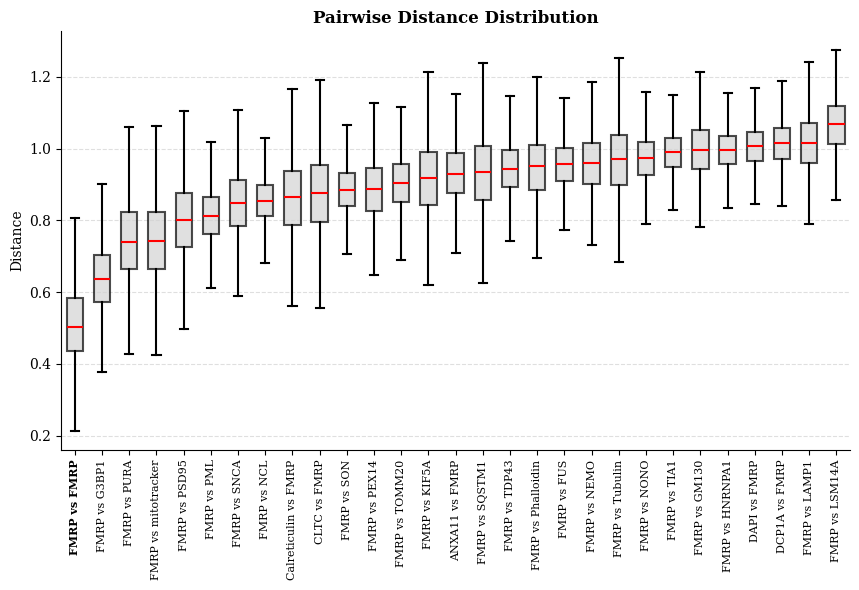

Marker: FUS


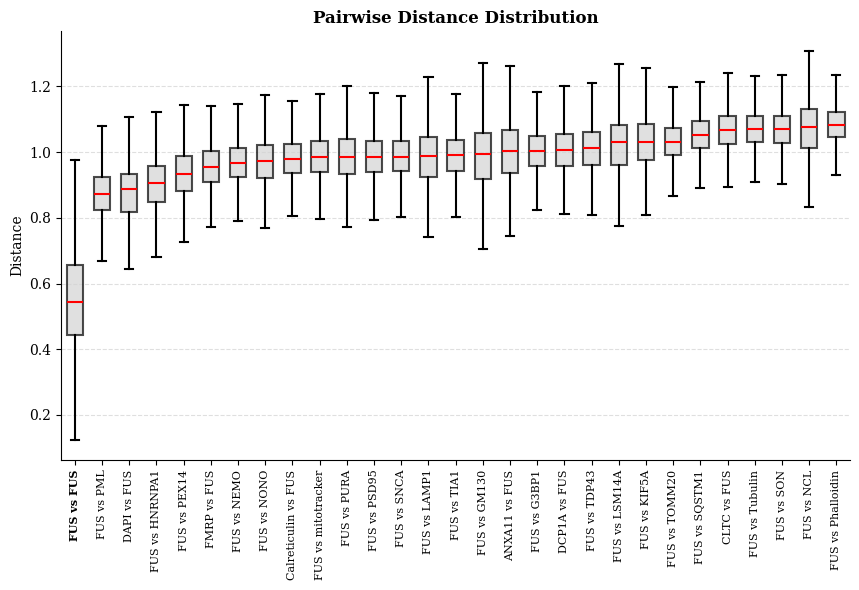

Marker: G3BP1


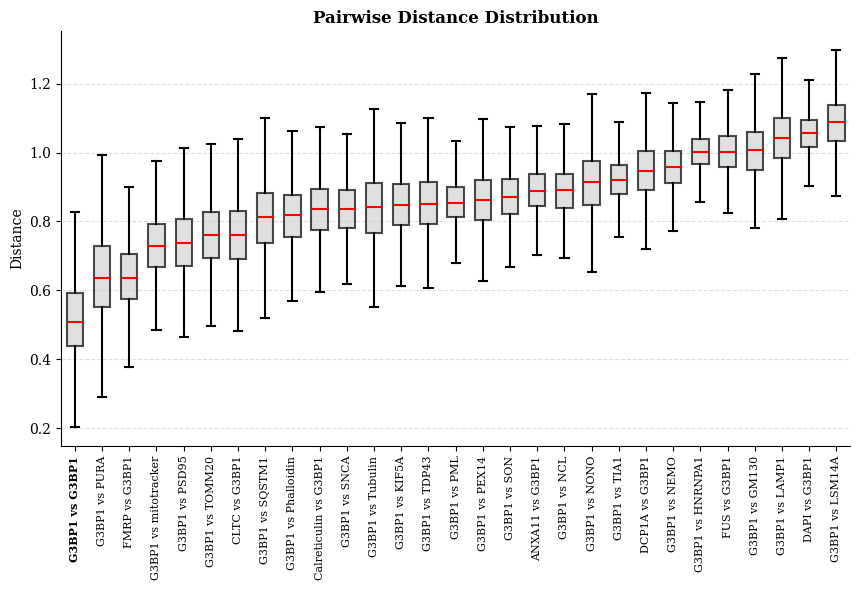

Marker: GM130


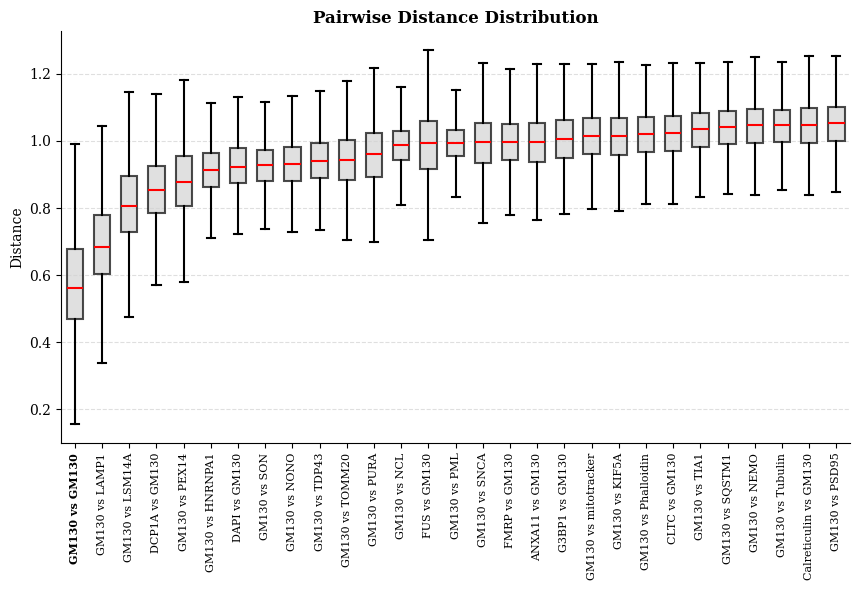

Marker: HNRNPA1


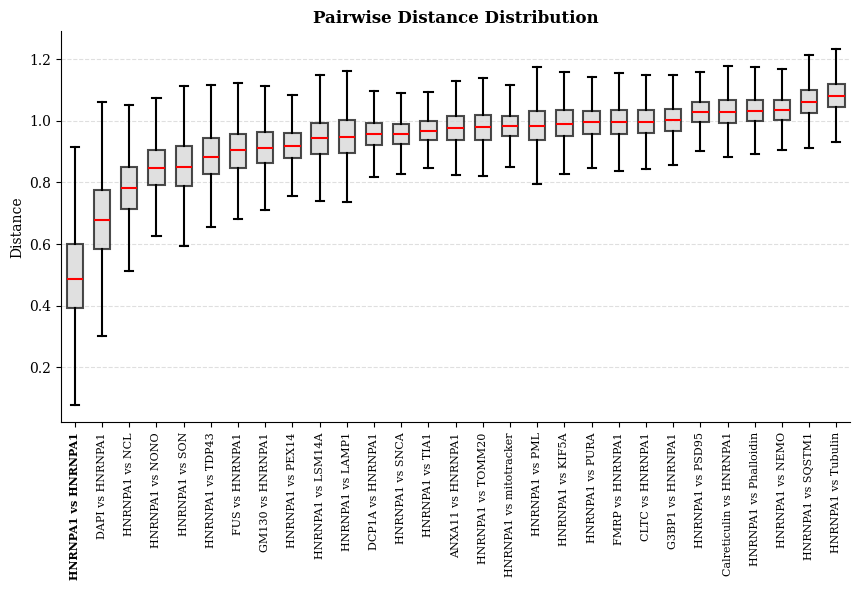

Marker: KIF5A


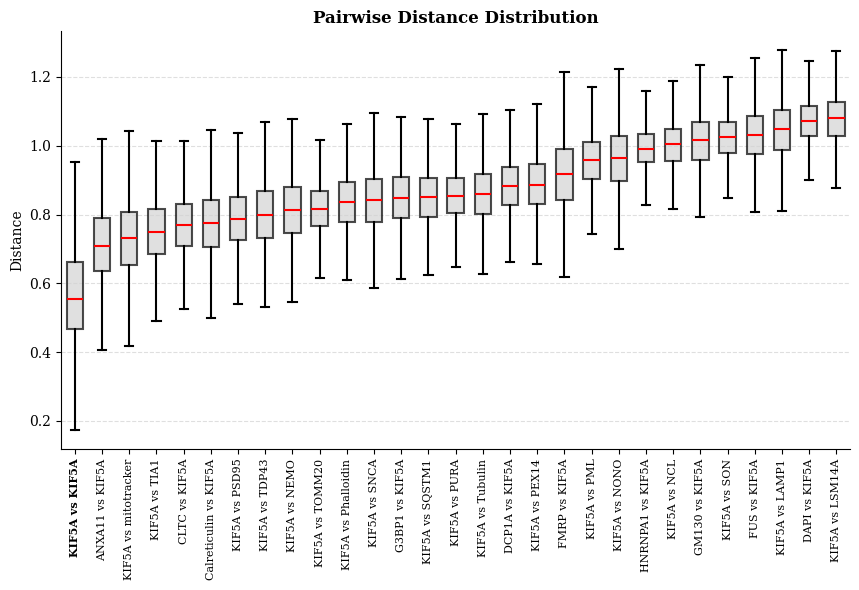

Marker: LAMP1


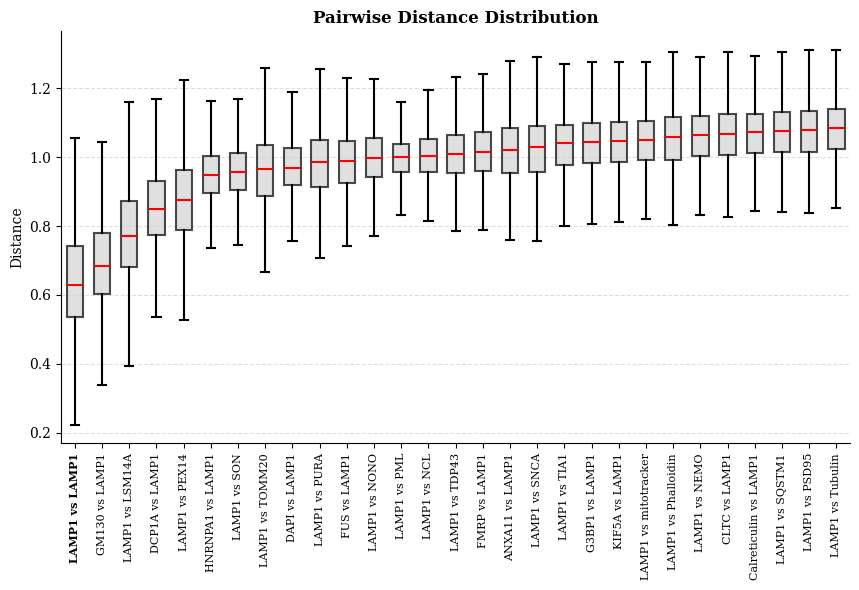

Marker: LSM14A


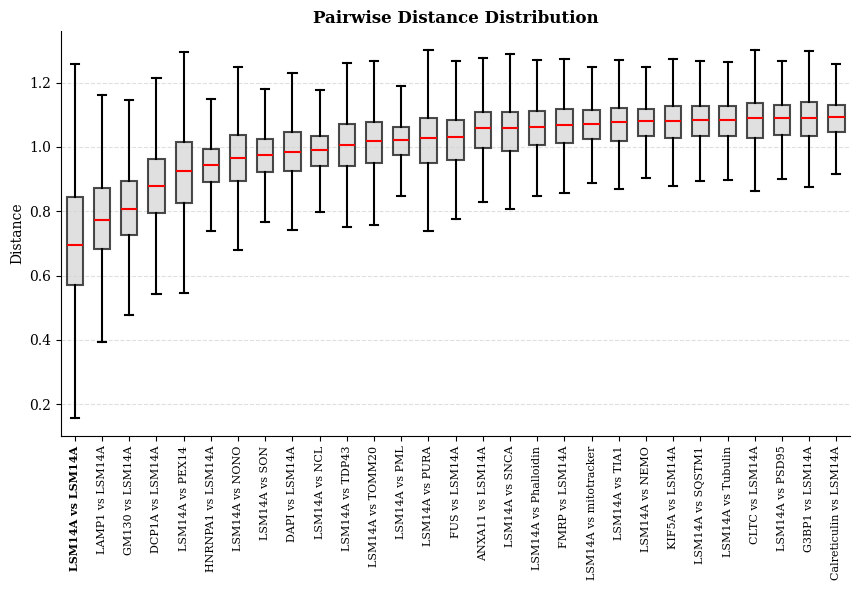

Marker: NCL


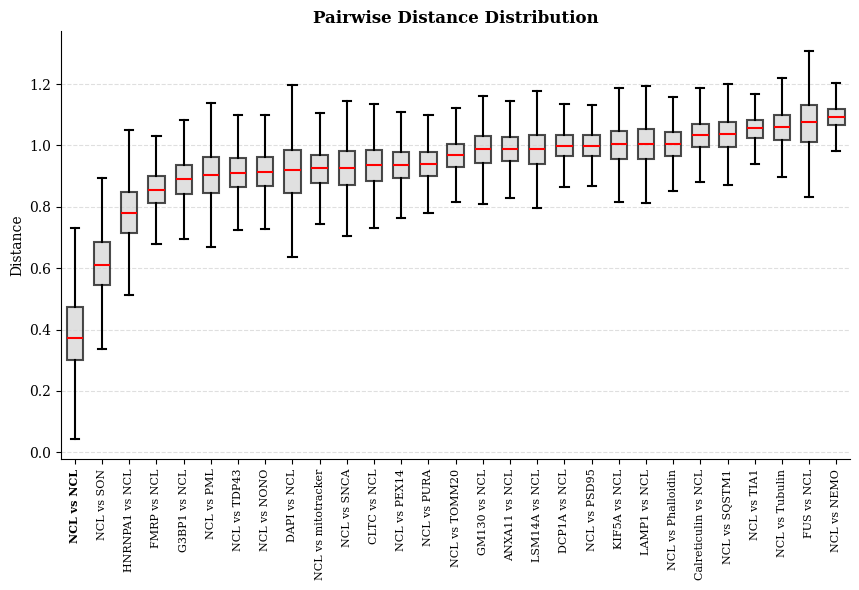

Marker: NEMO


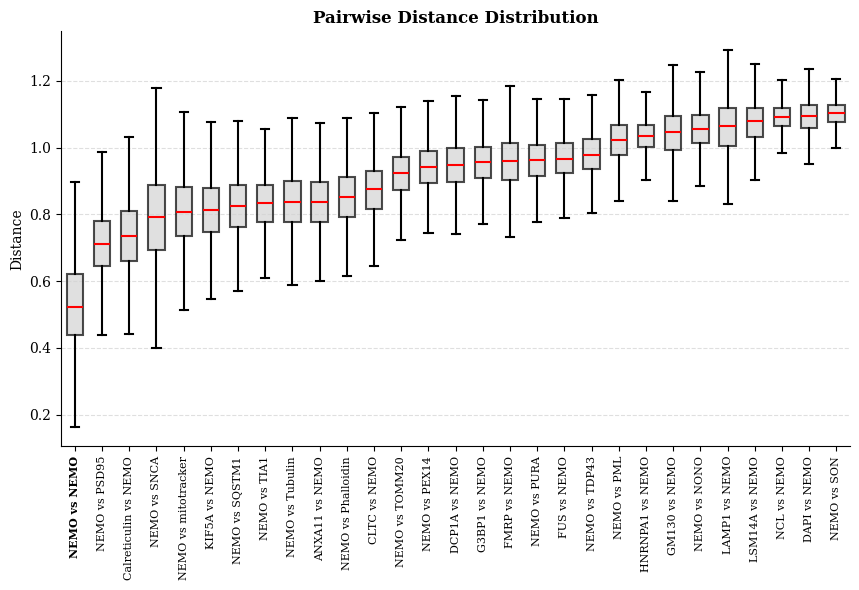

Marker: NONO


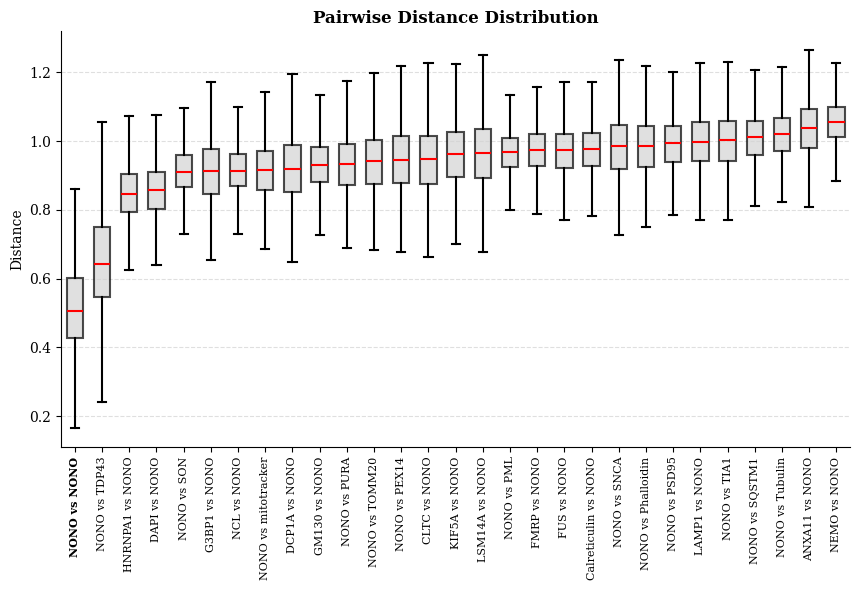

Marker: PEX14


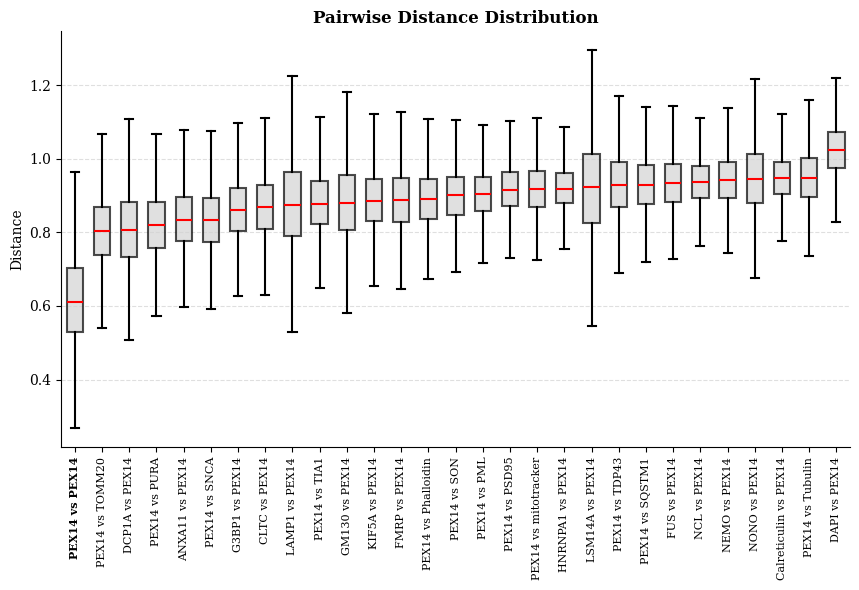

Marker: PML


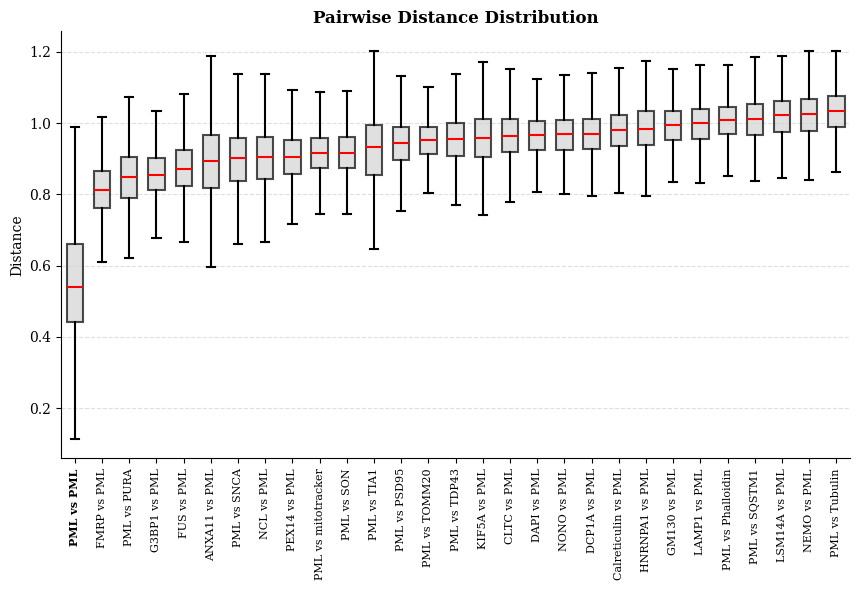

Marker: PSD95


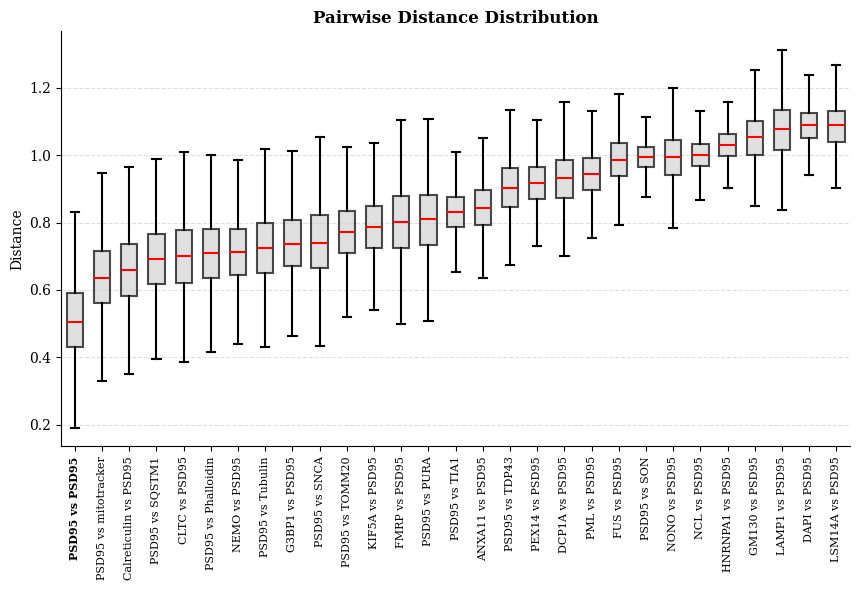

Marker: PURA


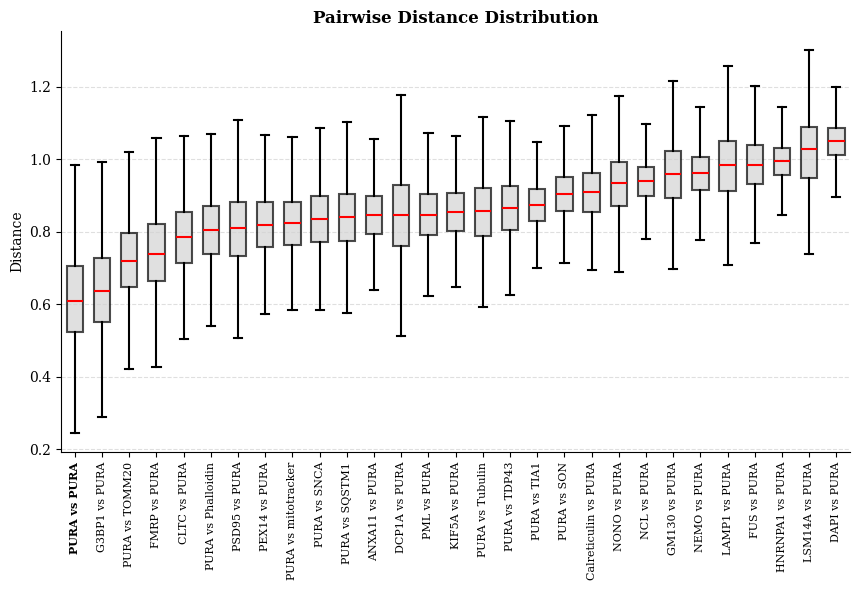

Marker: Phalloidin


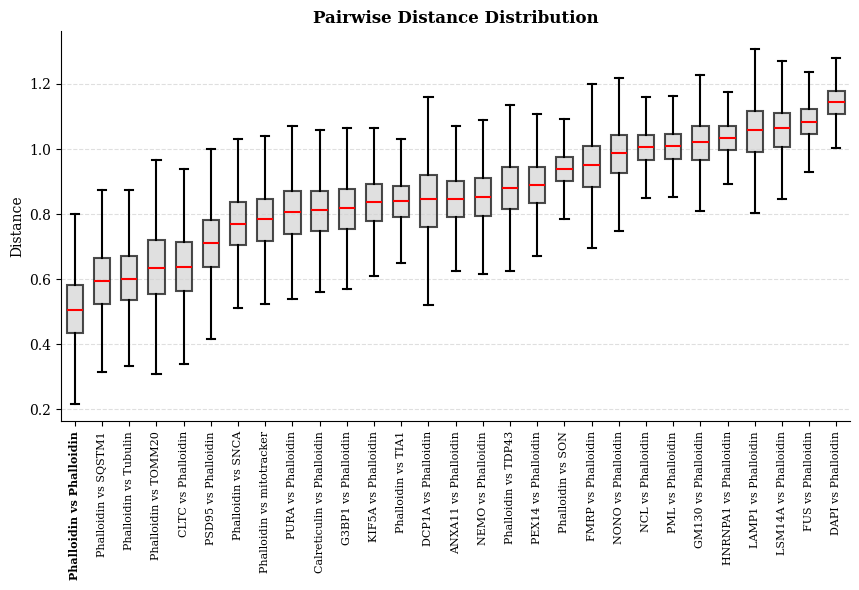

Marker: SNCA


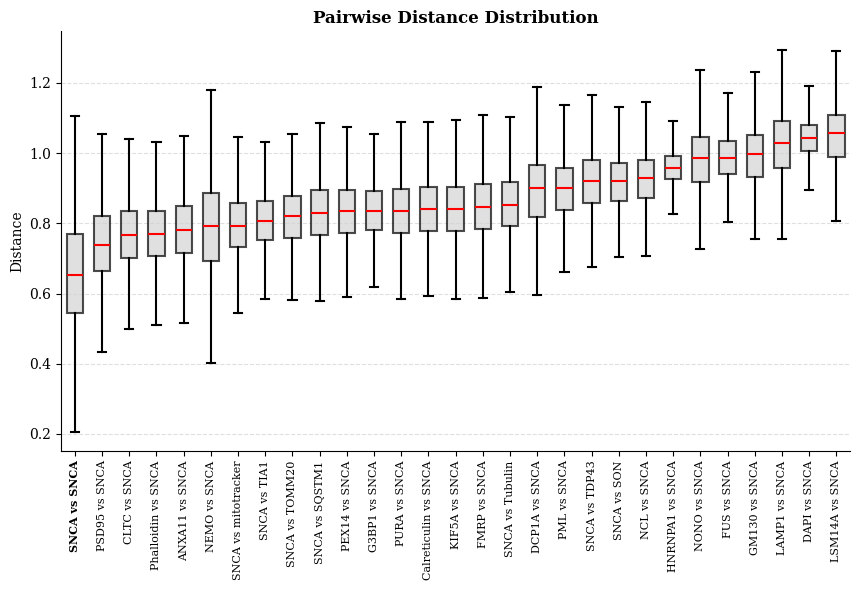

Marker: SON


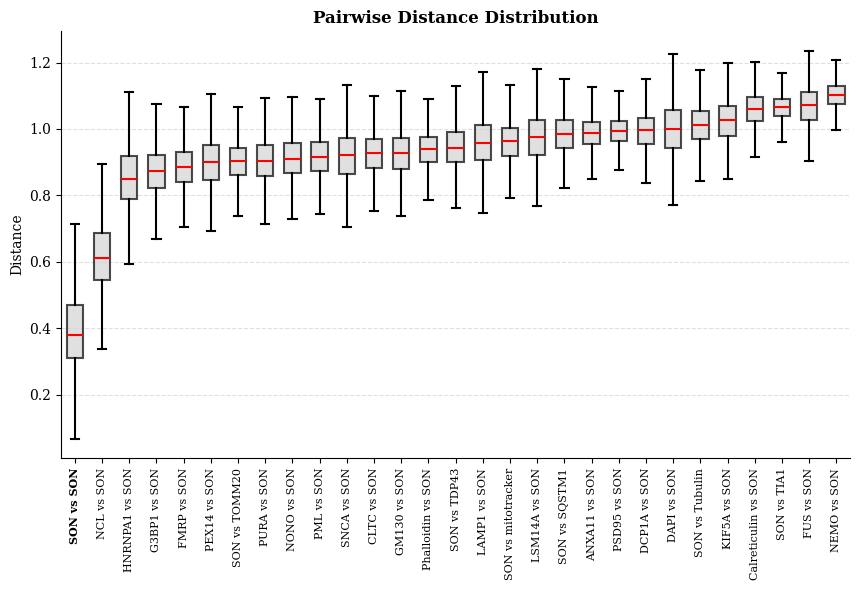

Marker: SQSTM1


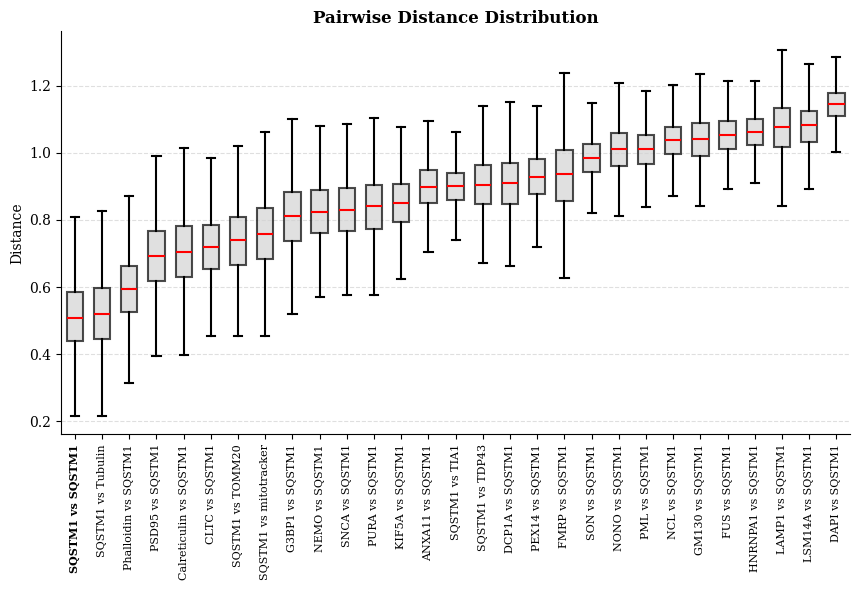

Marker: TDP43


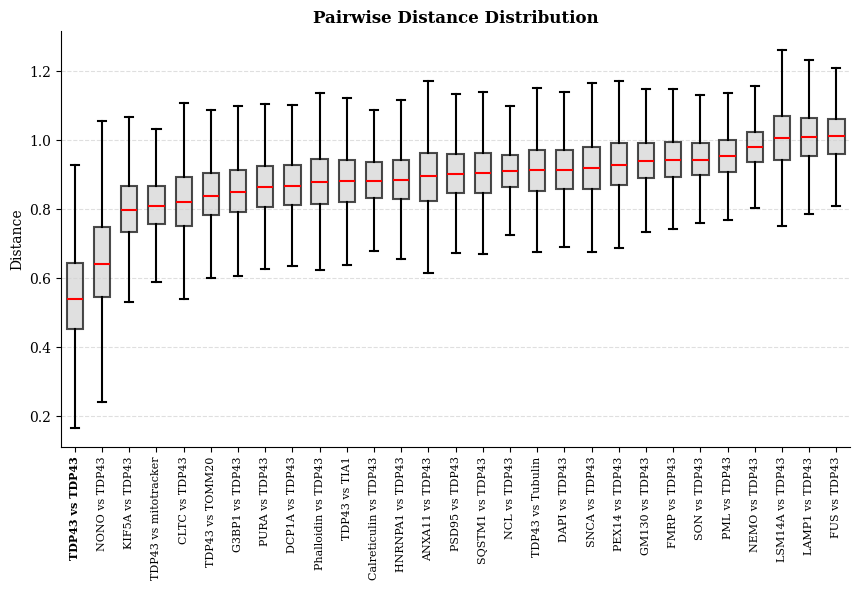

Marker: TIA1


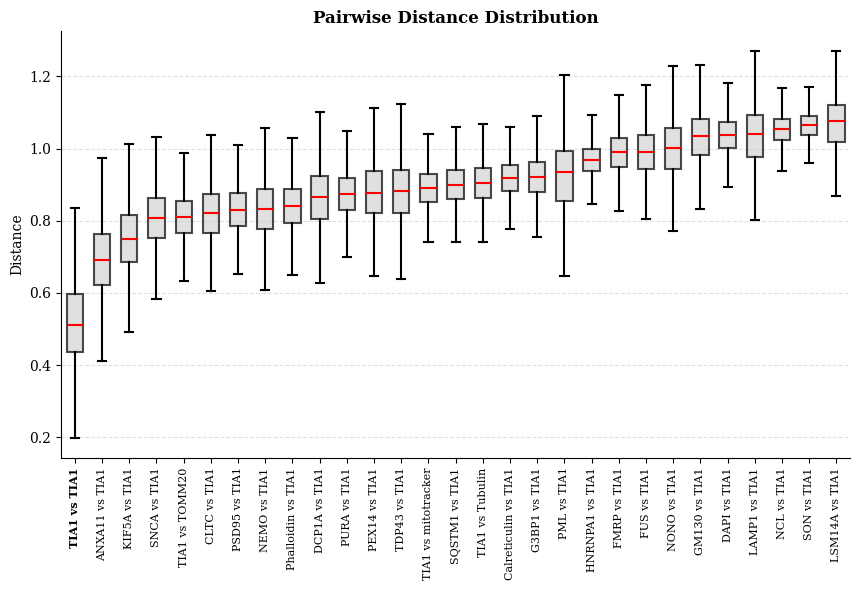

Marker: TOMM20


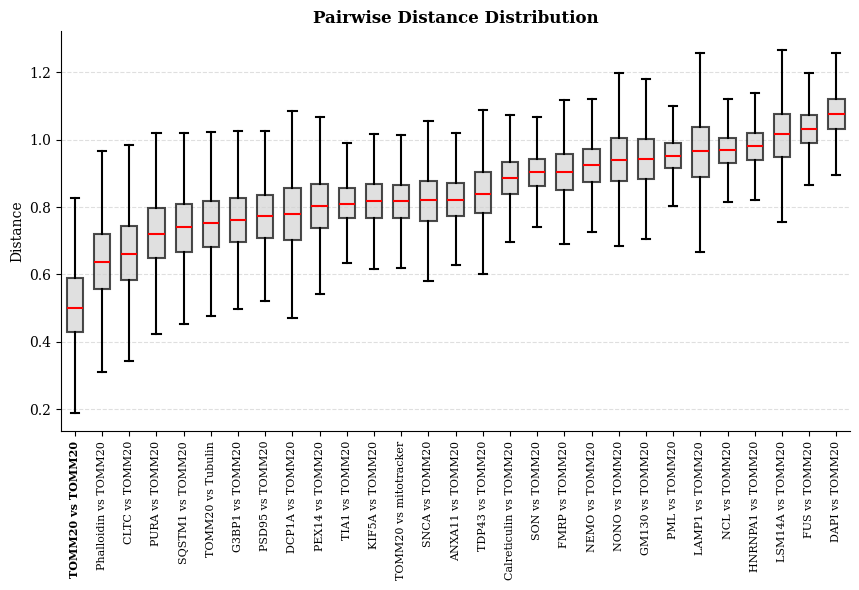

Marker: Tubulin


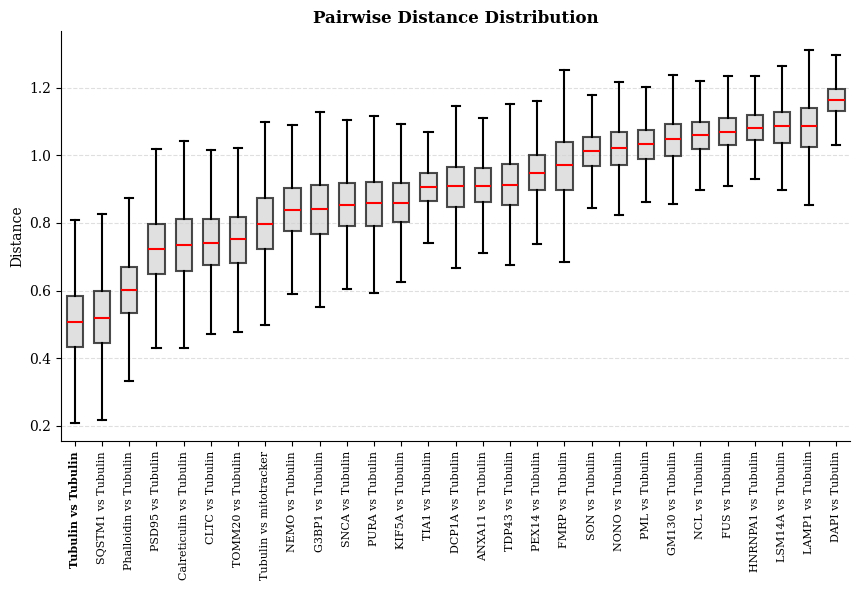

Marker: mitotracker


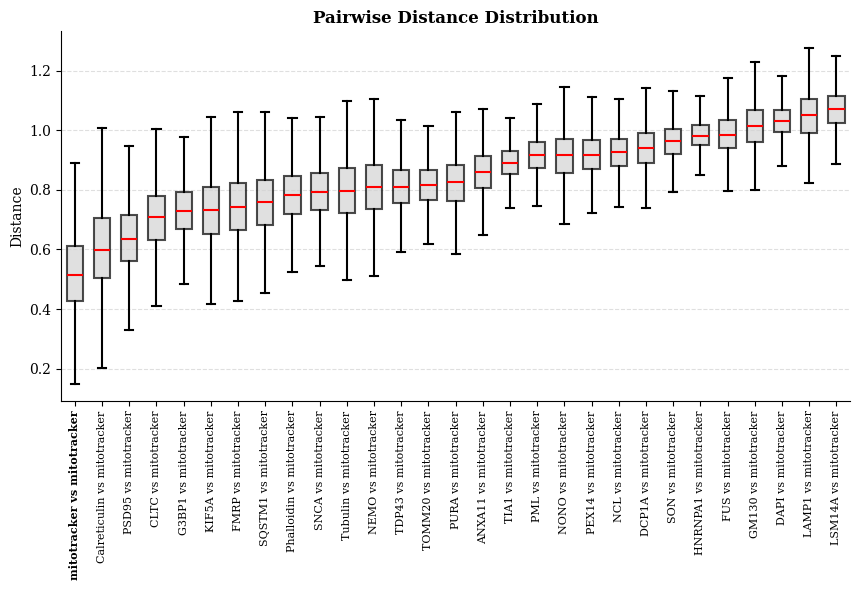

In [279]:
for label in np.unique(labels):
    print('Marker:', label)
    plot_custom_boxplot(df[(df['label1'].str.contains(label))|(df['label2'].str.contains(label))])

### UMAP for sanity check

/home/projects/hornsteinlab/galavir/.conda/envs/nova/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


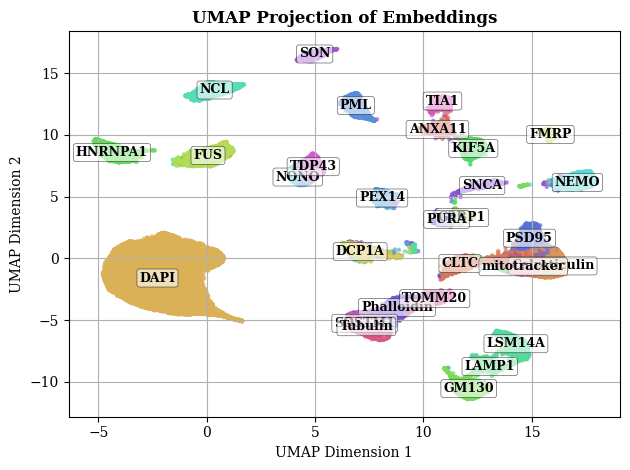

In [291]:
reducer = umap.UMAP(n_components=2, random_state=42)
embeddings_umap = reducer.fit_transform(embeddings)
plot_umap(embeddings_umap, labels)

In [298]:
df.nsmallest(20, 'p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
299,NCL,NCL,0.373354
407,SON,SON,0.379395
84,DAPI,DAPI,0.418604
57,Calreticulin,Calreticulin,0.483635
225,HNRNPA1,HNRNPA1,0.487893
429,TOMM20,TOMM20,0.501046
135,FMRP,FMRP,0.503806
330,NONO,NONO,0.504985
369,PSD95,PSD95,0.505048
390,Phalloidin,Phalloidin,0.505826


### Nearest clusters

In [280]:
df.loc[df['label1'] != df['label2']].nsmallest(10, 'p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
418,SQSTM1,Tubulin,0.518675
393,Phalloidin,SQSTM1,0.593089
83,Calreticulin,mitotracker,0.598340
397,Phalloidin,Tubulin,0.601287
308,NCL,SON,0.610600
396,Phalloidin,TOMM20,0.635211
379,PSD95,mitotracker,0.635387
194,G3BP1,PURA,0.635628
137,FMRP,G3BP1,0.636537
48,CLTC,Phalloidin,0.636593


### Tightest clusters

In [281]:
df.loc[df['label1'] == df['label2']].nsmallest(30, 'p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
299,NCL,NCL,0.373354
407,SON,SON,0.379395
84,DAPI,DAPI,0.418604
57,Calreticulin,Calreticulin,0.483635
225,HNRNPA1,HNRNPA1,0.487893
429,TOMM20,TOMM20,0.501046
135,FMRP,FMRP,0.503806
330,NONO,NONO,0.504985
369,PSD95,PSD95,0.505048
390,Phalloidin,Phalloidin,0.505826


### Most distant clusters

In [282]:
df.loc[df['label1'] != df['label2']].nlargest(10, 'p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
108,DAPI,Tubulin,1.163382
104,DAPI,SQSTM1,1.144320
101,DAPI,Phalloidin,1.143468
31,CLTC,DAPI,1.112972
323,NEMO,SON,1.103250
95,DAPI,NEMO,1.094177
300,NCL,NEMO,1.093336
67,Calreticulin,LSM14A,1.091403
187,G3BP1,LSM14A,1.089859
288,LSM14A,PSD95,1.089667


### Embeddings histogram 

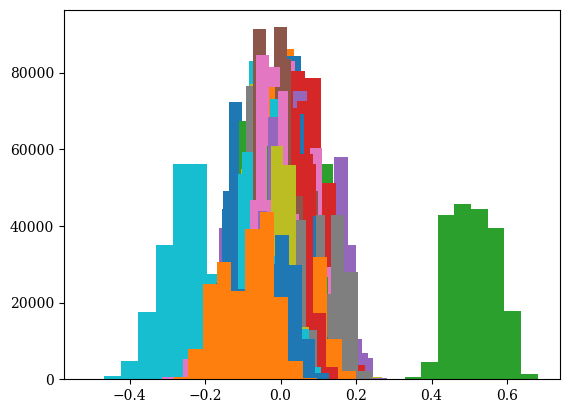

In [283]:
plt.figure()
for i in range(np.shape(embeddings)[1]):
    plt.hist(embeddings[:,i])
plt.show()

### Euclidean and Cosine distances align on L₂‑normalized embeddings (model level normalization)

Max absolute difference: 1.21e-07
Mean absolute difference: 3.01e-08


<IPython.core.display.Javascript object>


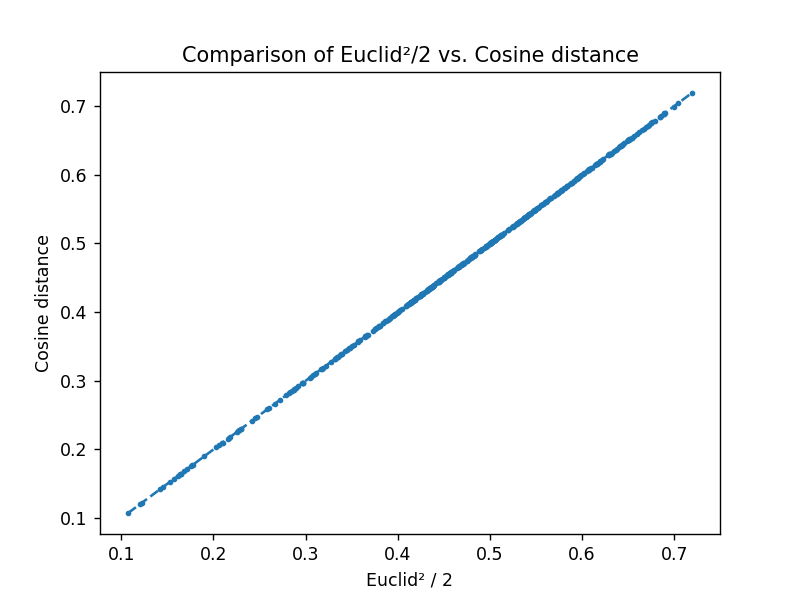

In [141]:
"""
    Given two DataFrames with the same index and a distance column,
    prints max and mean absolute difference between Euclid²/2 and cosine,
    and shows a scatter plot comparing them.
"""


## df = Distance calculates with Euclidean metric
## dfe = Distance calculates with Cosine metric
# dfe = pd.read_csv('./output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP1_B9_cosine.csv') 
# compare_euclidean_cosine(df, dfe,'p50') ## Transform euclidean distances to get cosine distances 

### Visualizations

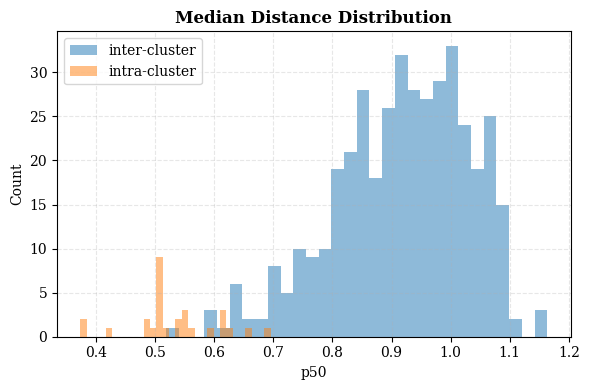

In [284]:
plot_dist_histogram(df)

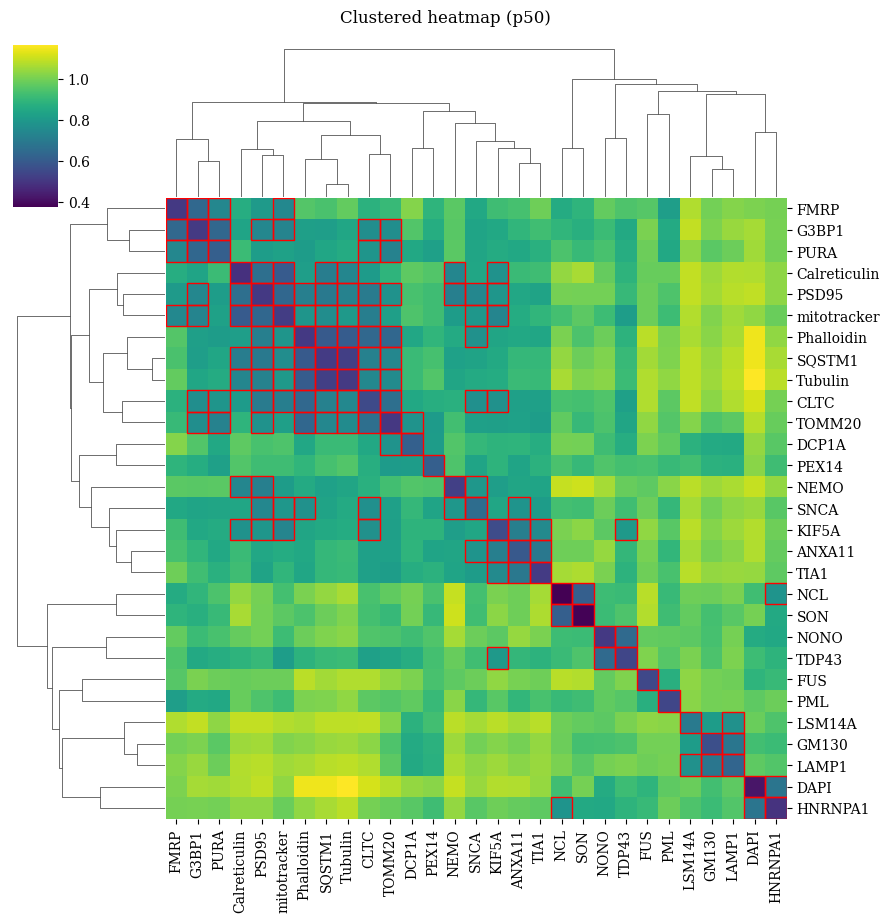

In [285]:
plot_label_clustermap(df, figsize=(9,9), highlight_thresh = 0.8) ## Set threshold to highlight

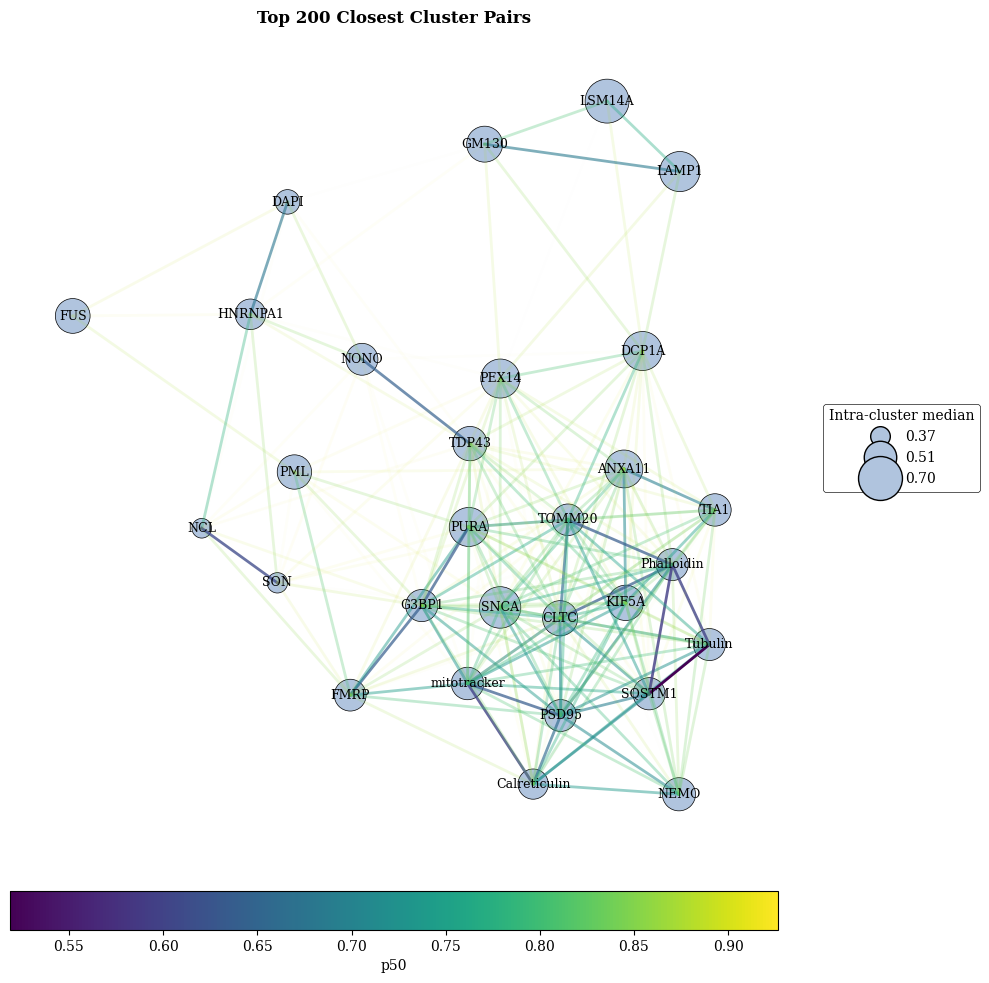

In [286]:
plot_cluster_proximity_network(df, metric='p50', top_k=200, )

### How much is this reproducible between batches?

### Load all available batches distances (umap1)

In [111]:
batches = range(1,11)

dfs, names = [], []
for b in batches:
    path = (
        f"output_distances/"
        f"label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP1_B{b}_euclidean_detailed:False.csv"
    )
    try:
        df = pd.read_csv(path)
        # strip the "_WT_Untreated" (or everything after first "_")
        for col in ("label1","label2"):
            df[col] = df[col].str.split(pat='_', n=1).str[0]
        dfs.append(df)
        names.append(f"batch{b}")
    except:
        print('batch', b, 'doesnt exists')
merged_df, cols = merge_batches_by_key(dfs, names) 

batch 4 doesnt exists
batch 5 doesnt exists
batch 6 doesnt exists


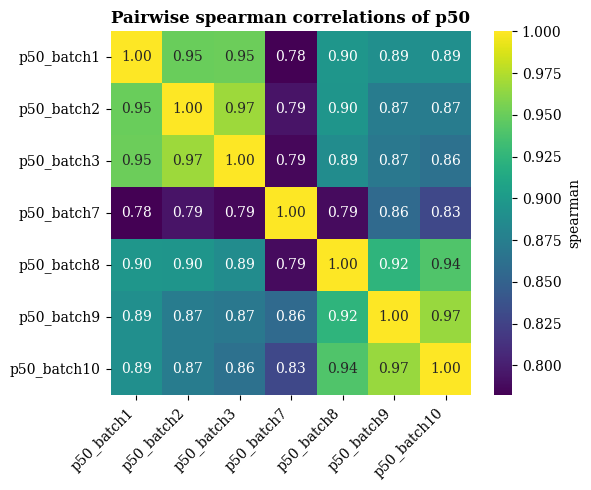

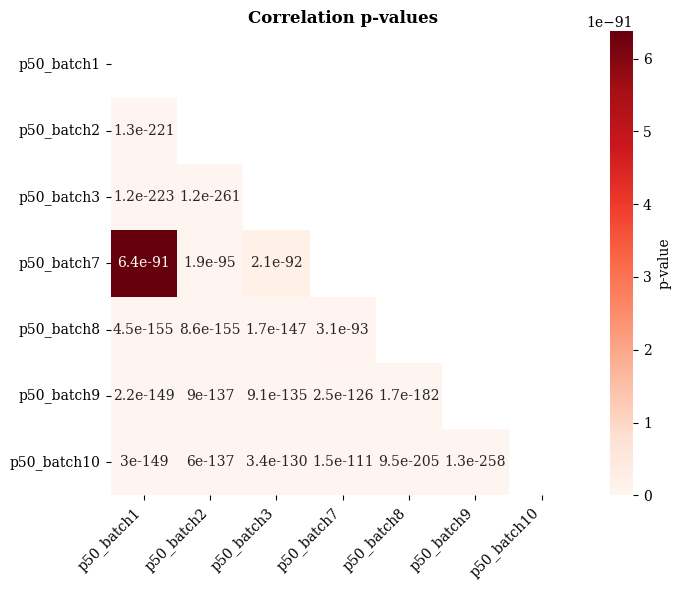

In [112]:
method = 'spearman'
corr_df, pval_df = correlate_columns(merged_df, cols, method=method)
plot_correlation_heatmap(corr_df, method=method)
plot_pval_heatmap(pval_df, labels=cols)

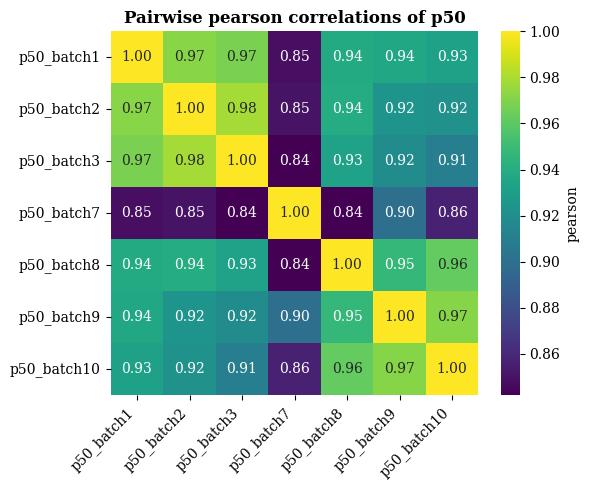

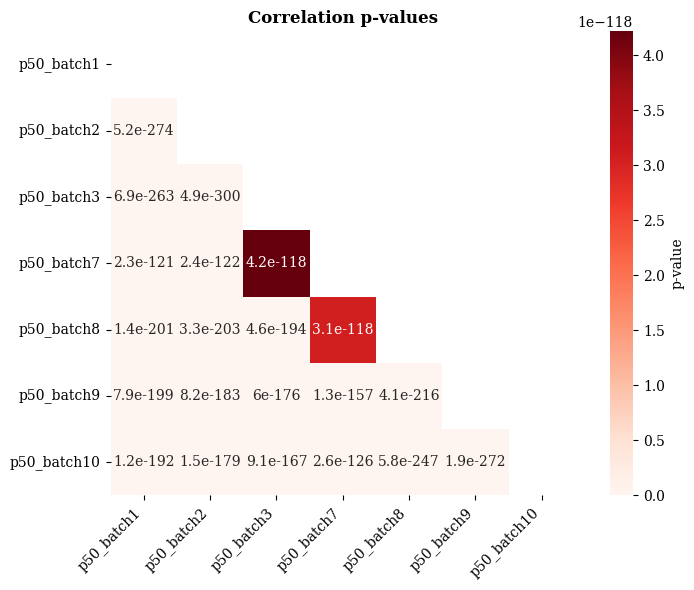

In [113]:
method = 'pearson'
corr_df, pval_df = correlate_columns(merged_df, cols, method=method)
plot_correlation_heatmap(corr_df, method=method)
plot_pval_heatmap(pval_df, labels=cols)

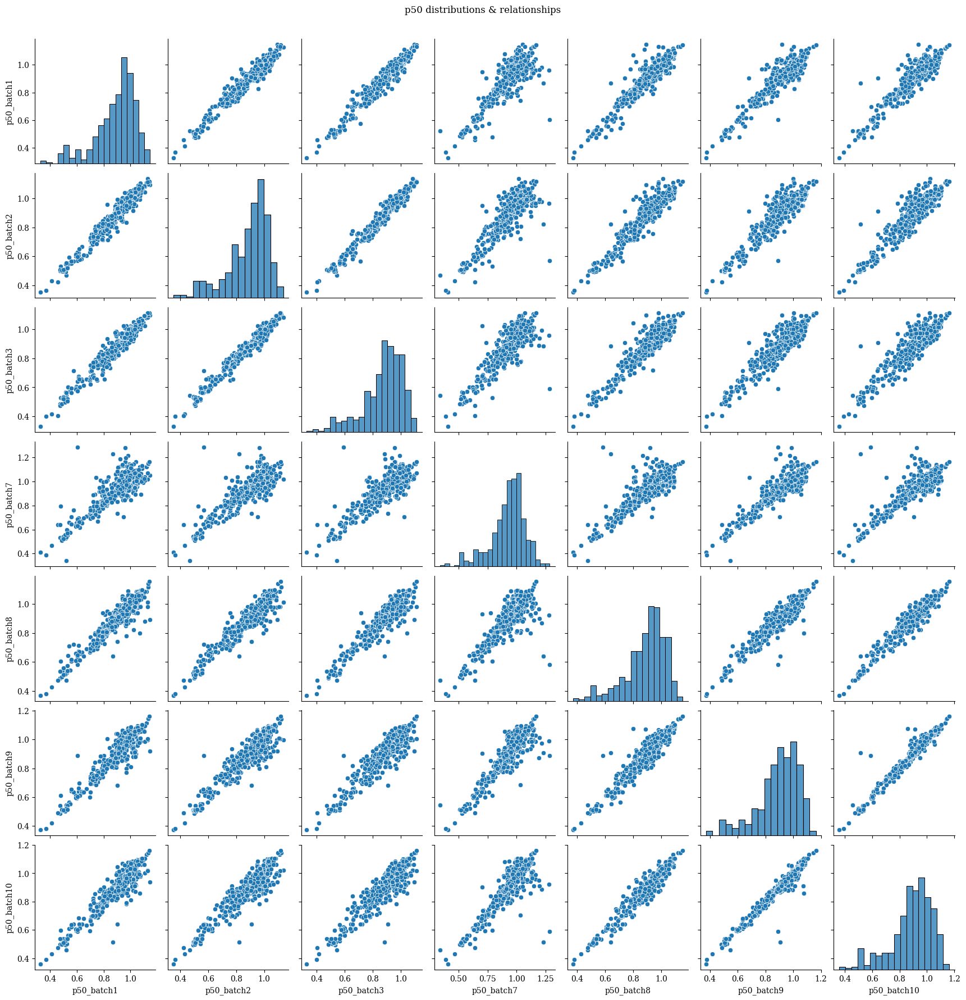

In [114]:
# 2) pairplot of the p50 columns
sns.pairplot(merged_df[[f"p50_{n}" for n in names]])
plt.suptitle("p50 distributions & relationships", y=1.02)
plt.show()

Marker: ANXA11


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


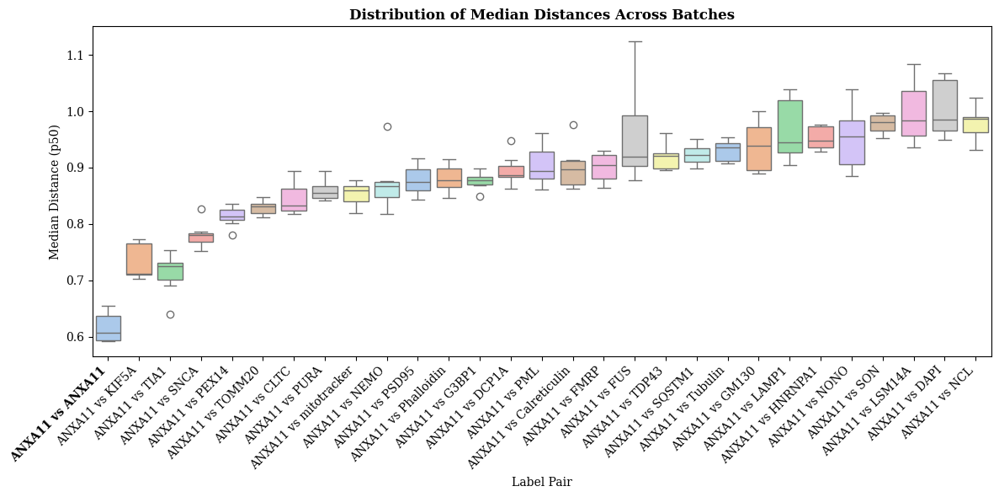

Marker: CLTC


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


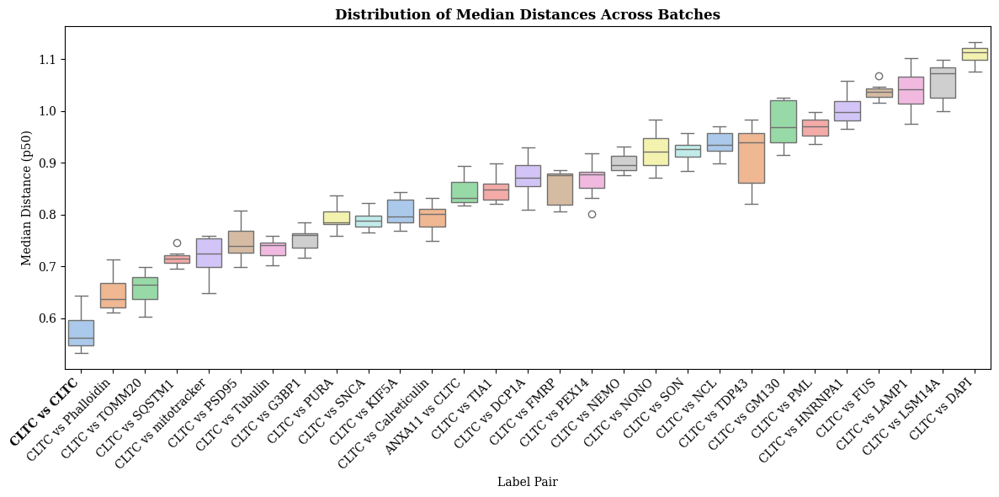

/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot


Marker: Calreticulin


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


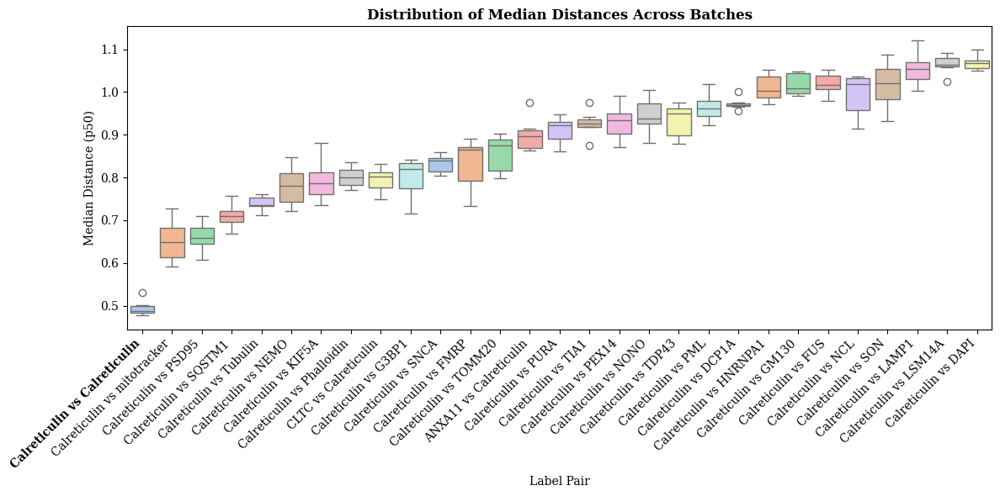

Marker: DAPI


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


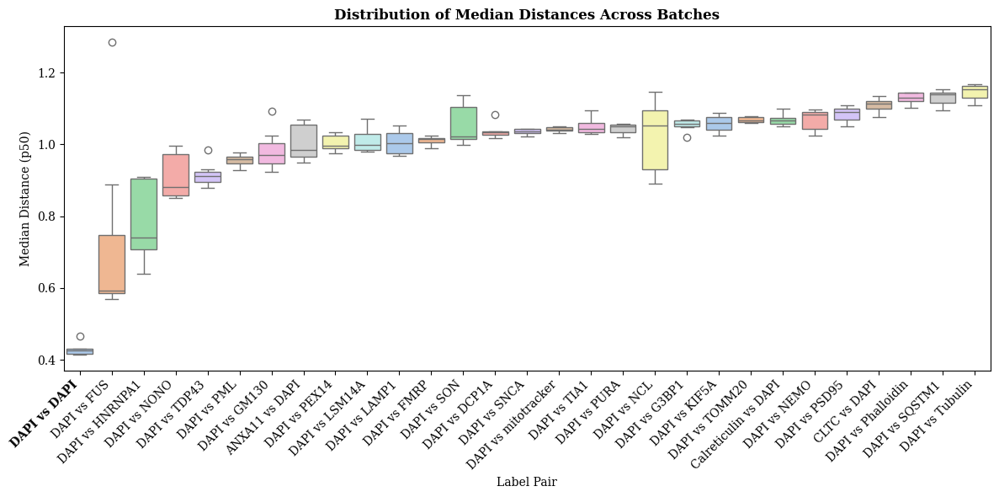

Marker: DCP1A


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


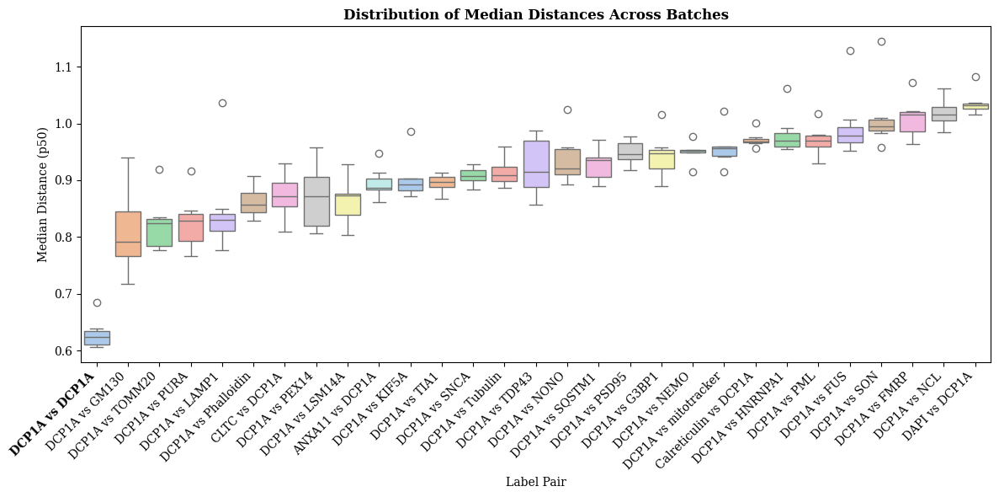

/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


Marker: FMRP


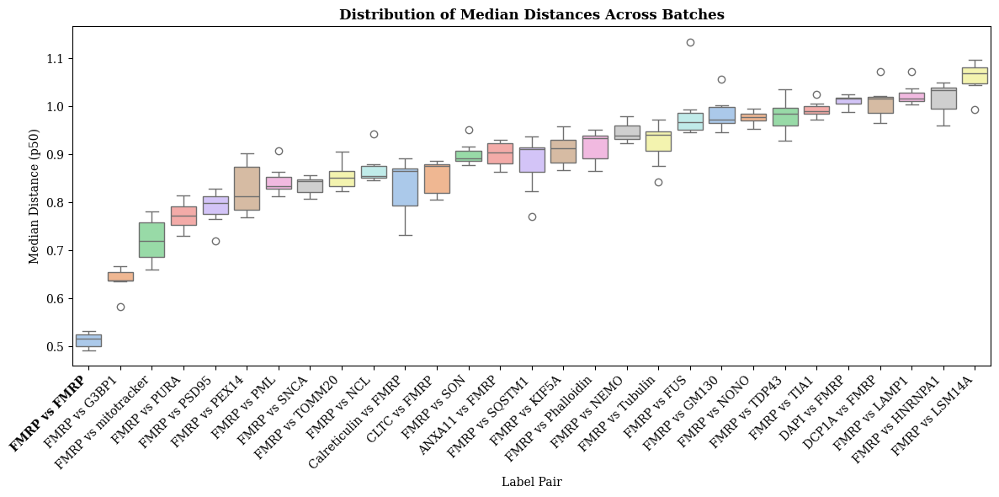

Marker: FUS


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


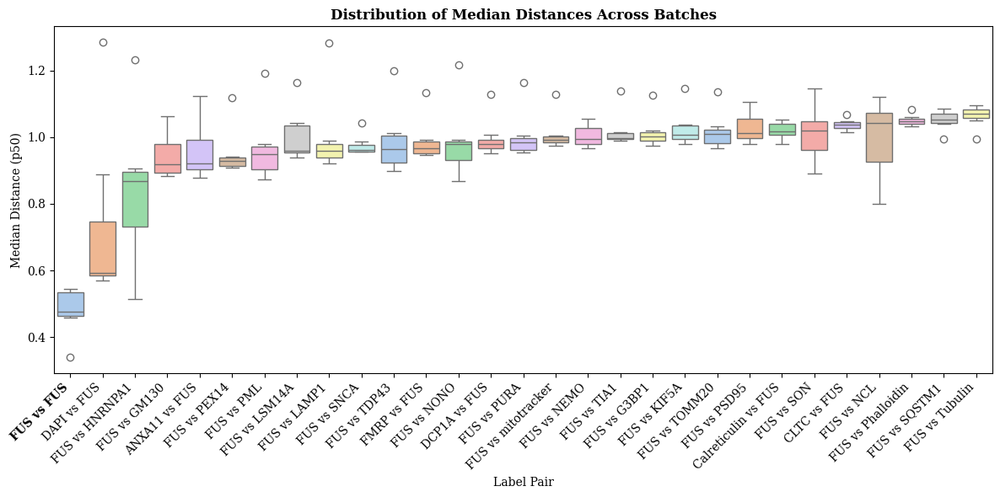

Marker: G3BP1


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


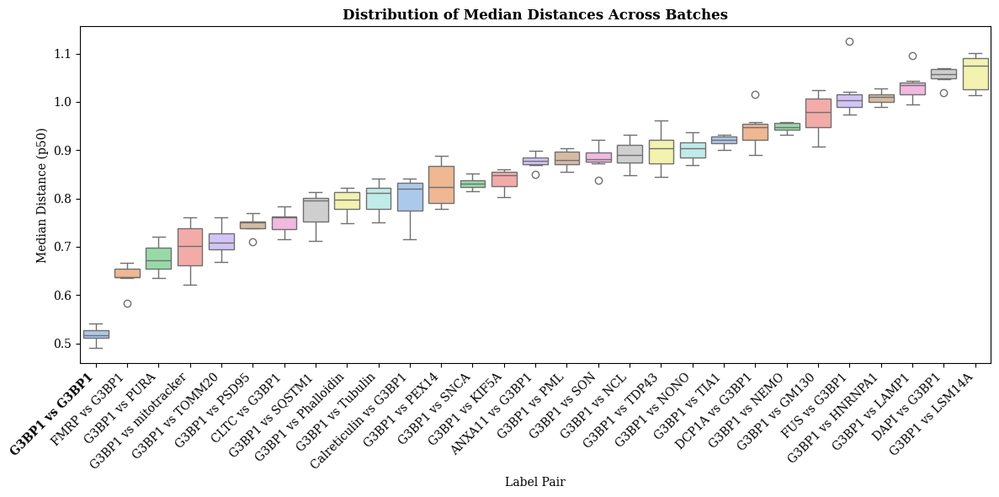

Marker: GM130


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


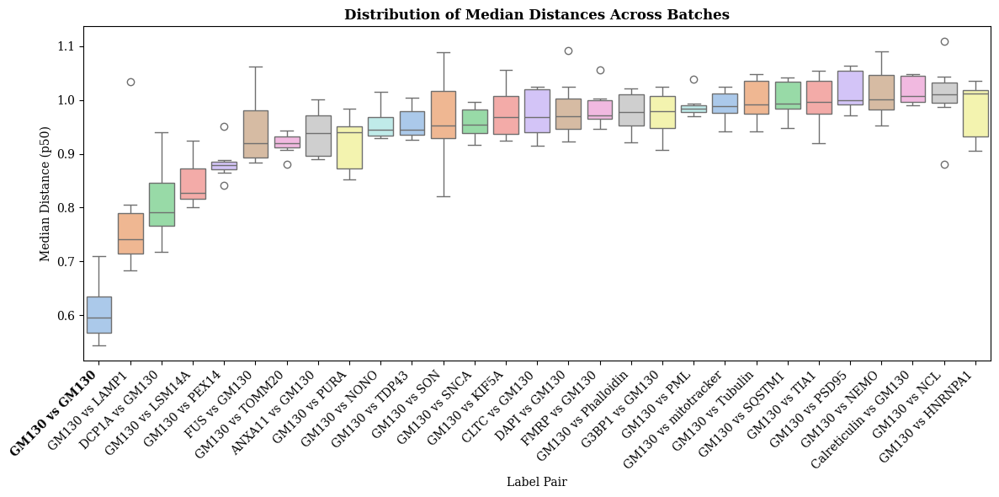

/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


Marker: HNRNPA1


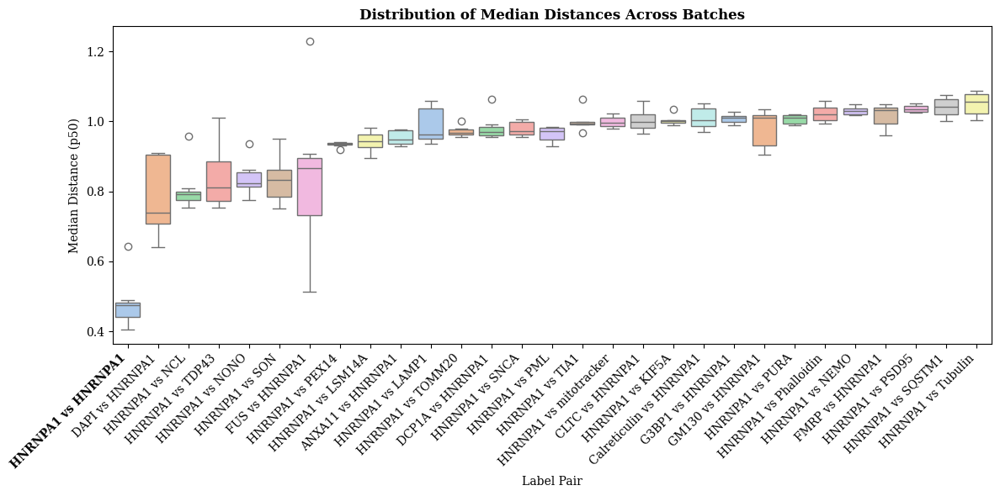

Marker: KIF5A


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


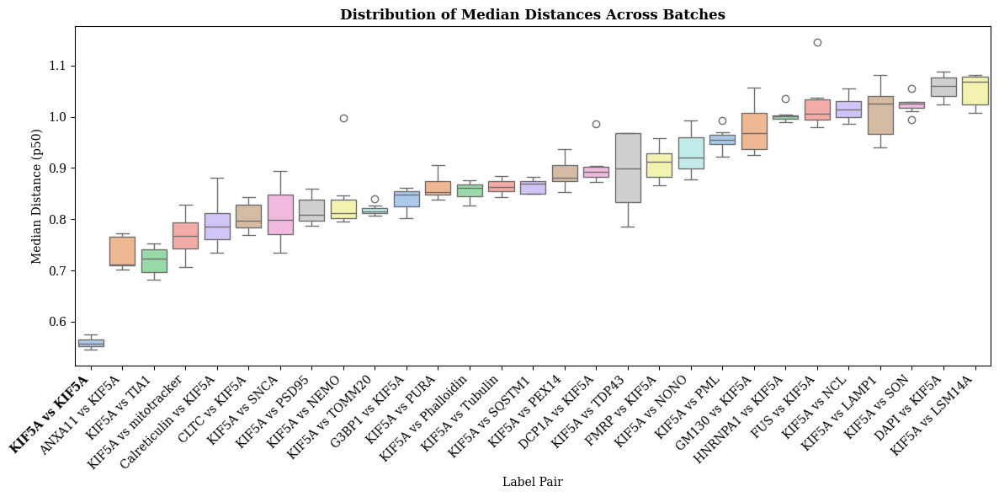

Marker: LAMP1


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


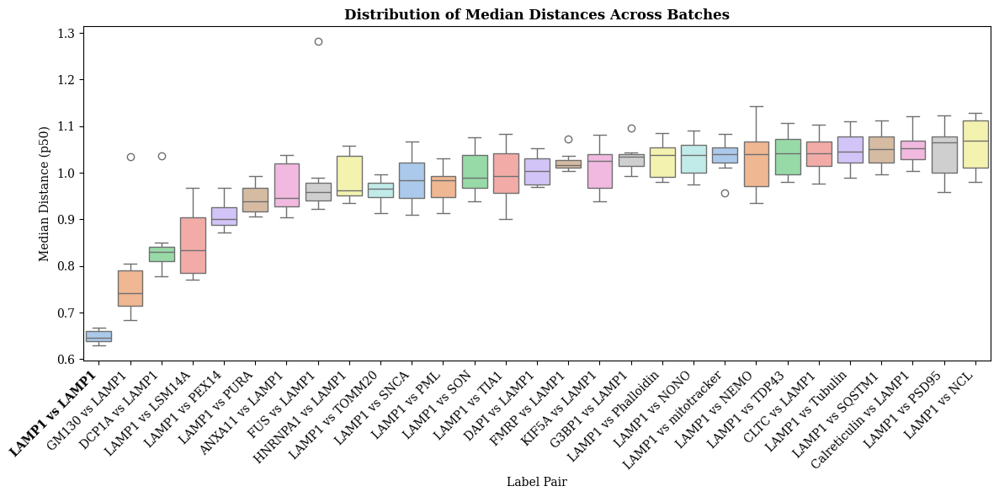

Marker: LSM14A


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


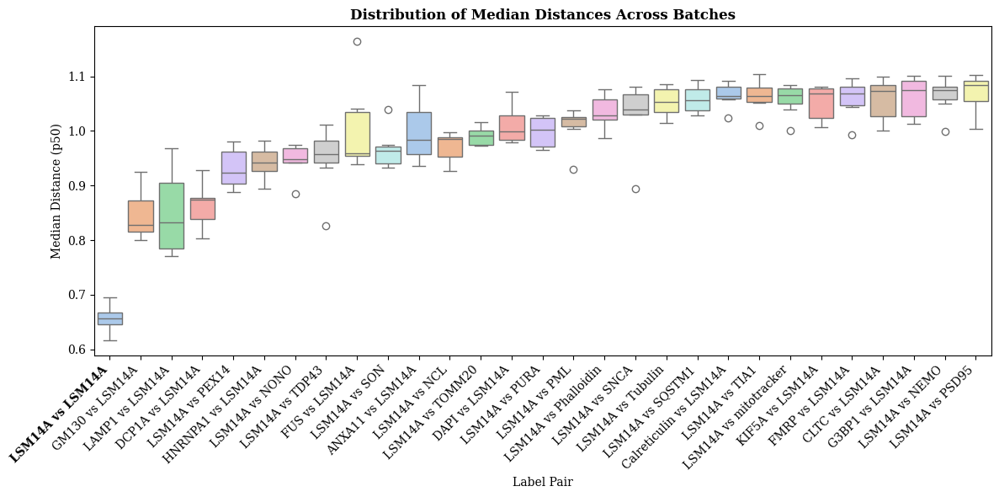

Marker: NCL


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


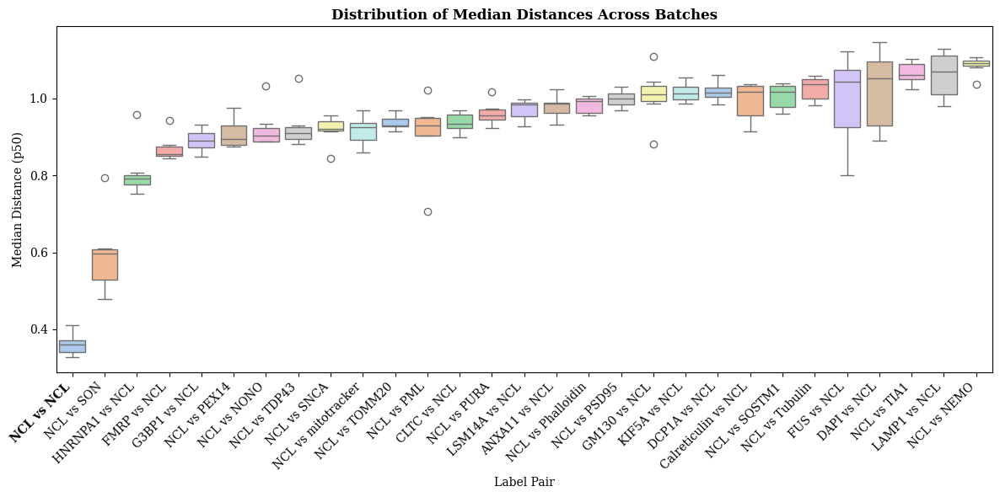

Marker: NEMO


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


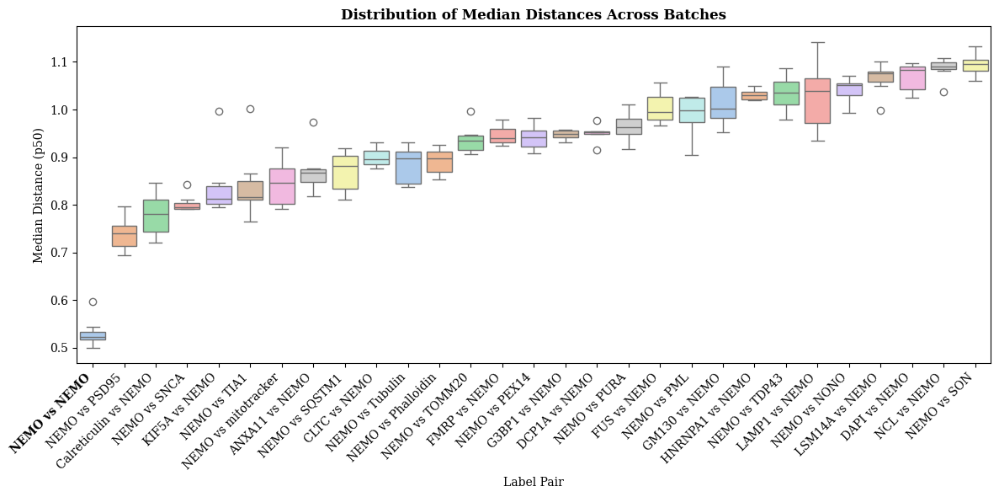

Marker: NONO


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


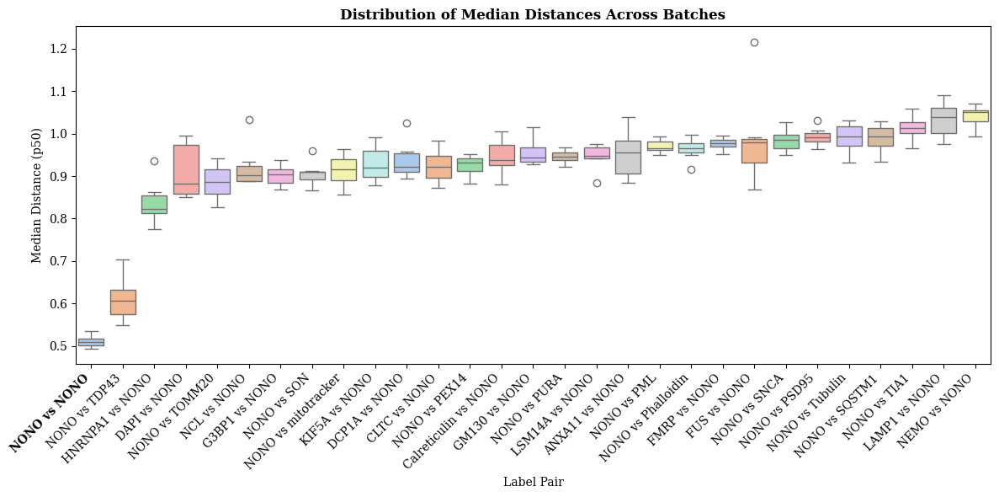

Marker: PEX14


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


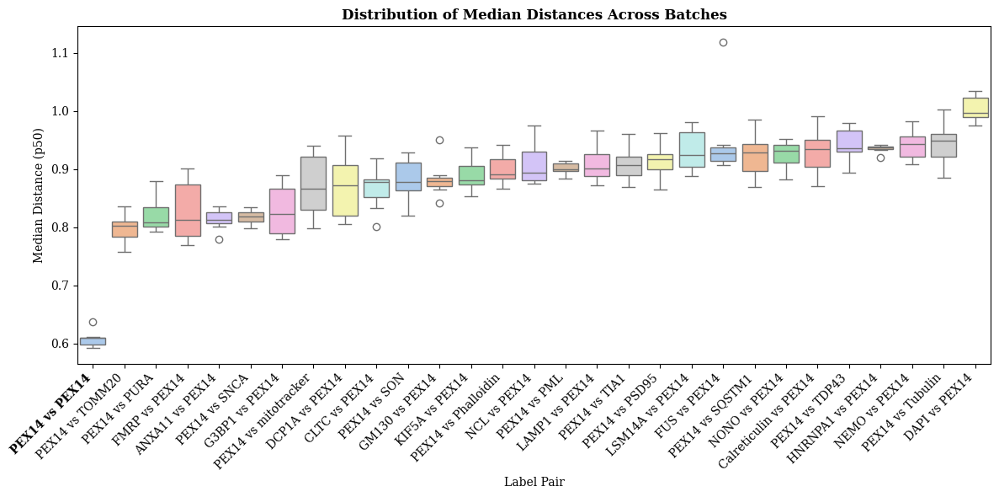

Marker: PML


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


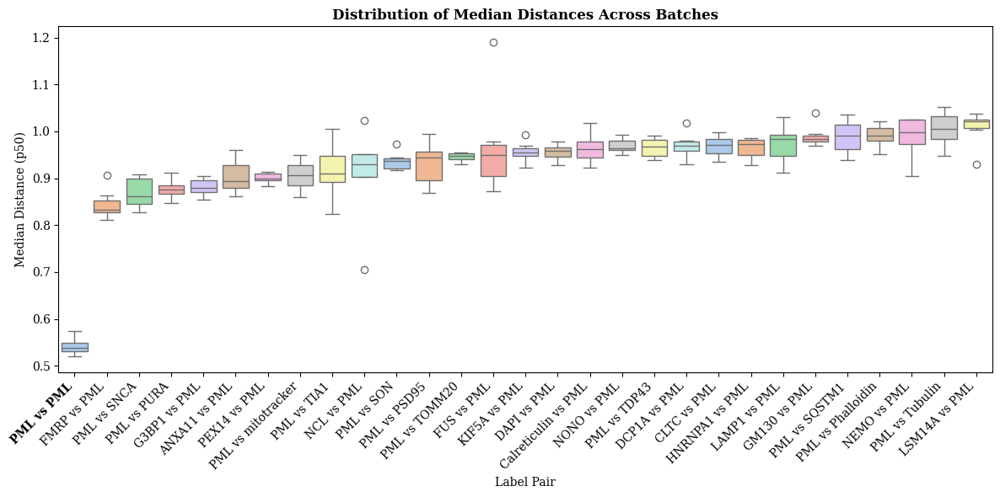

Marker: PSD95


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


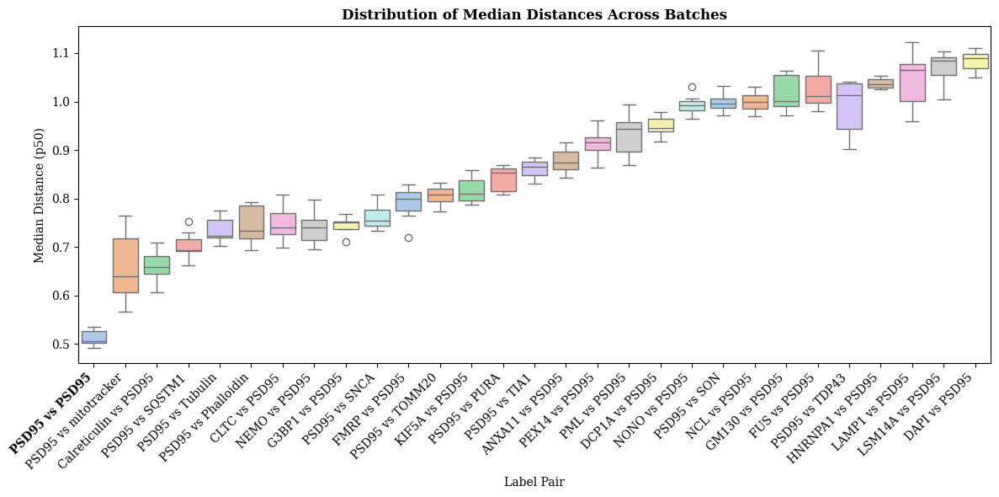

Marker: PURA


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


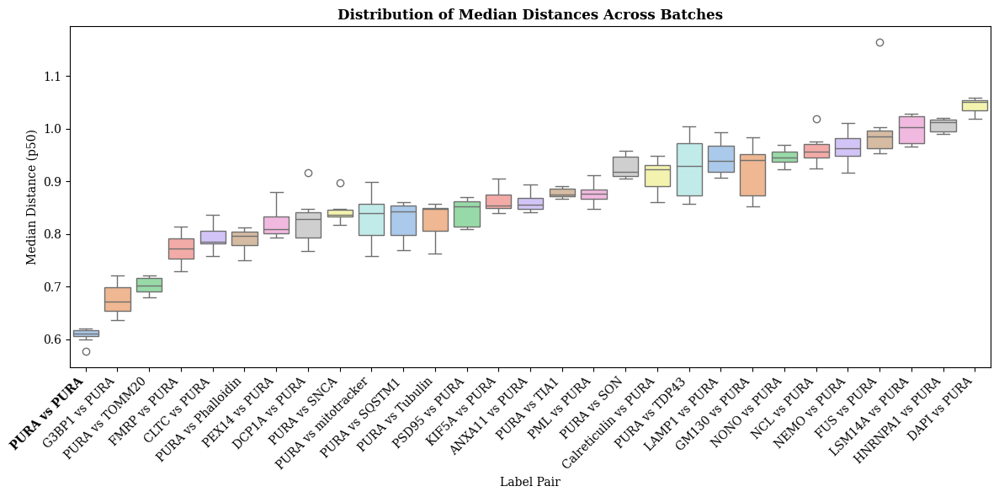

Marker: Phalloidin


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


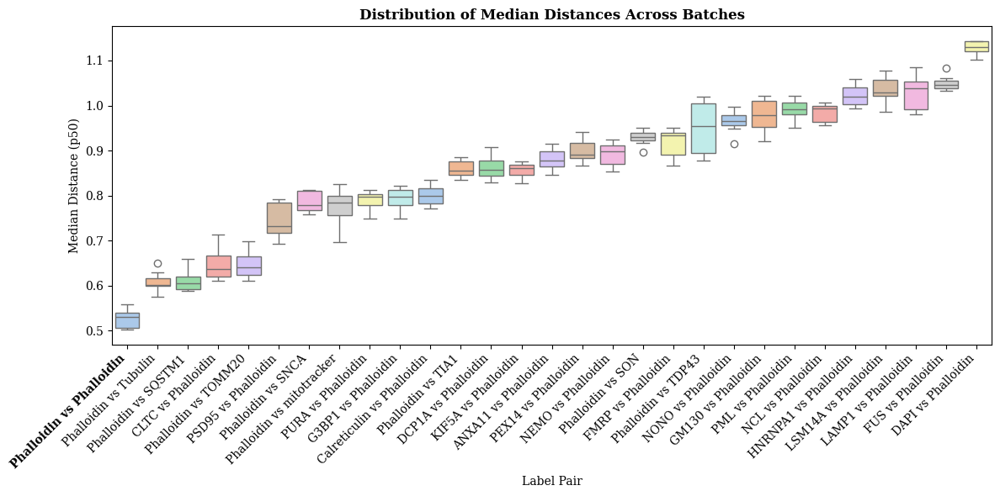

Marker: SNCA


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


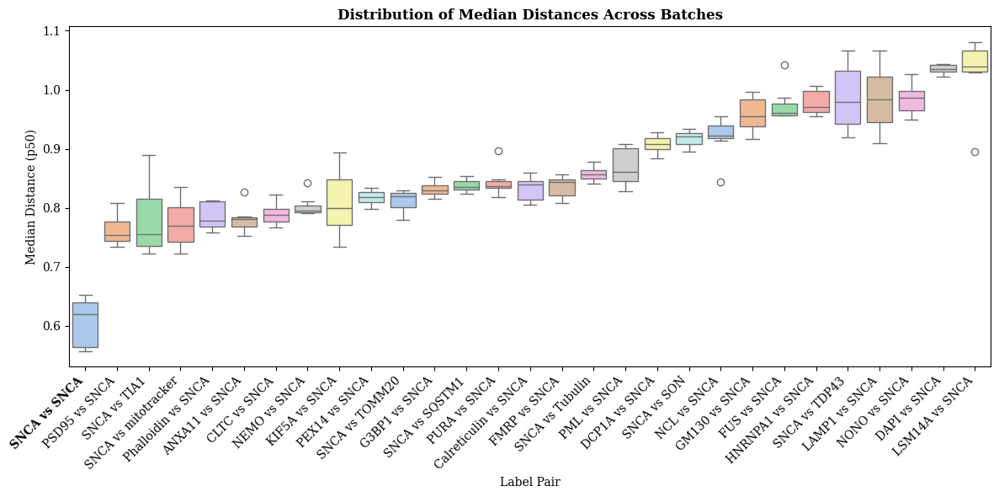

Marker: SON


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


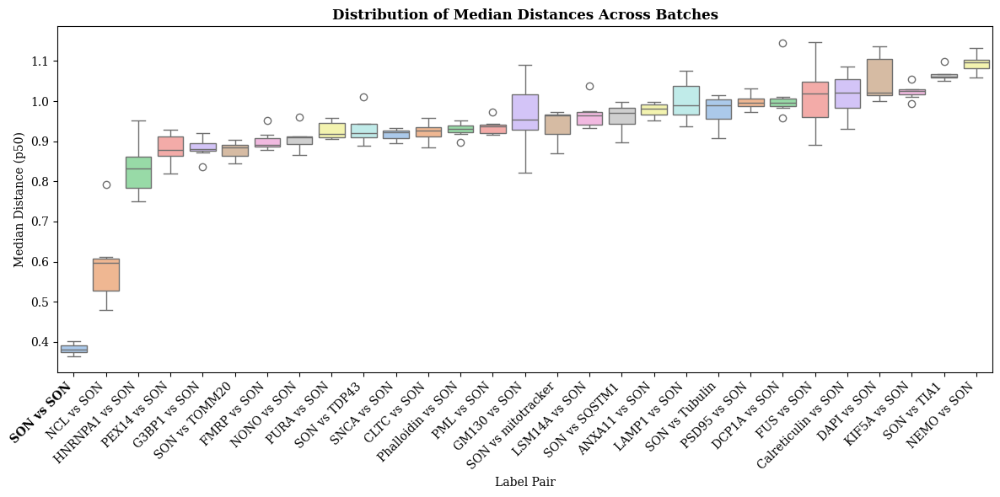

/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


Marker: SQSTM1


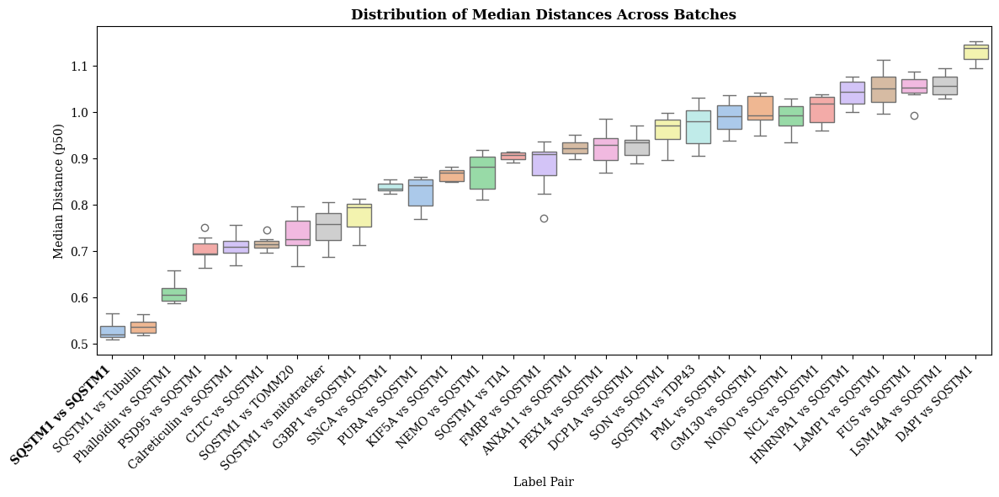

Marker: TDP43


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


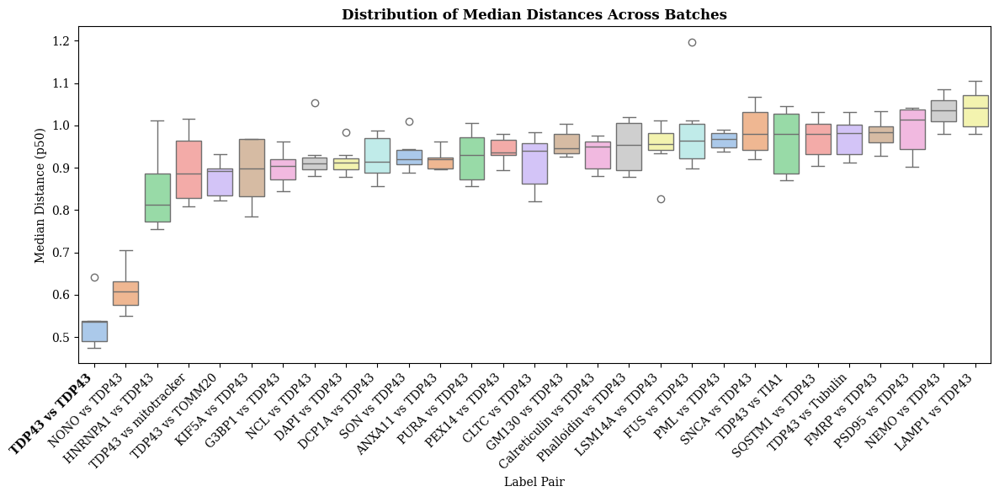

Marker: TIA1


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


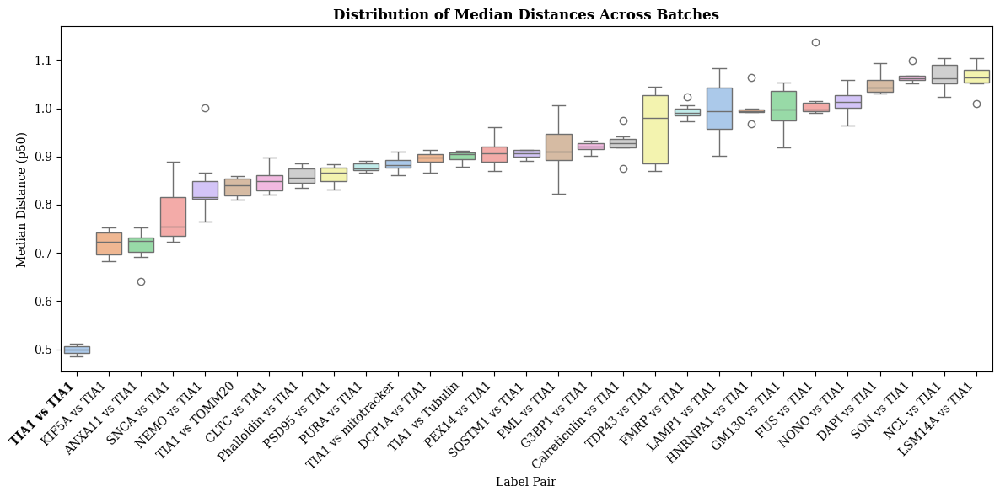

Marker: TOMM20


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


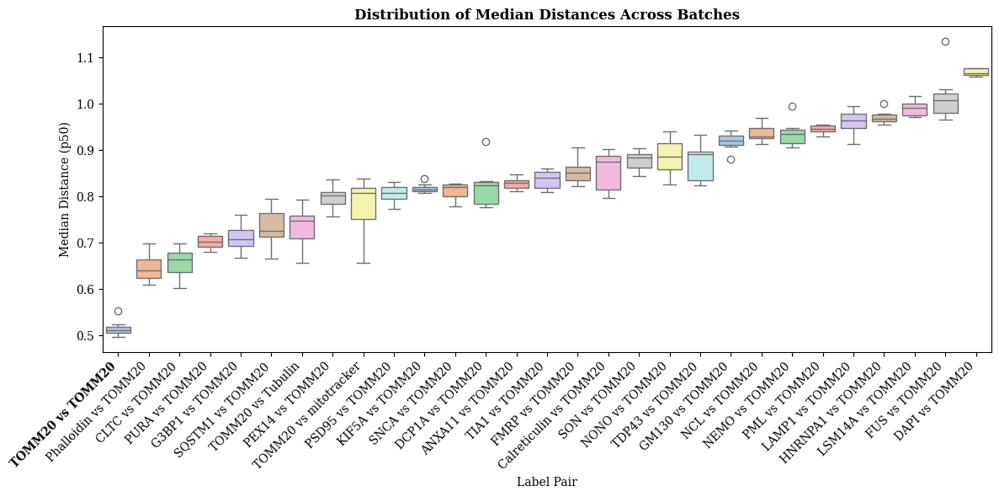

Marker: Tubulin


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


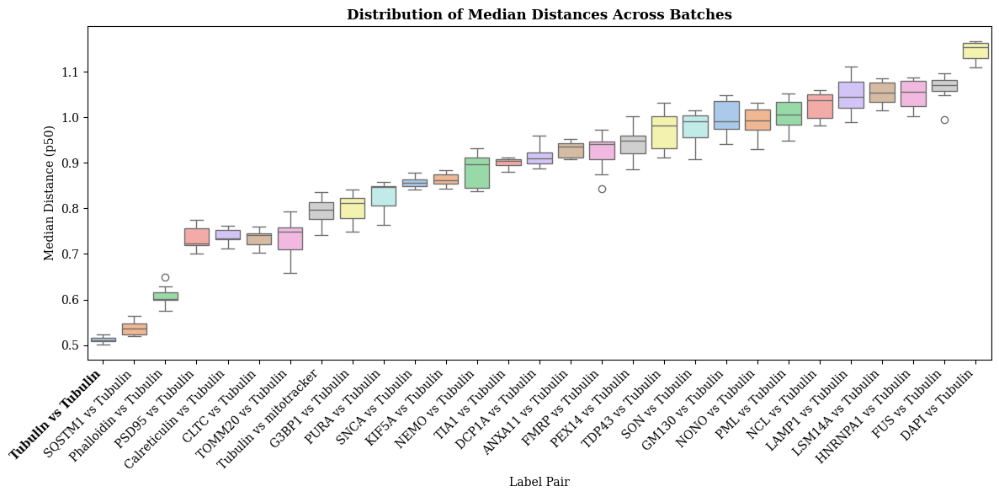

Marker: mitotracker


/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


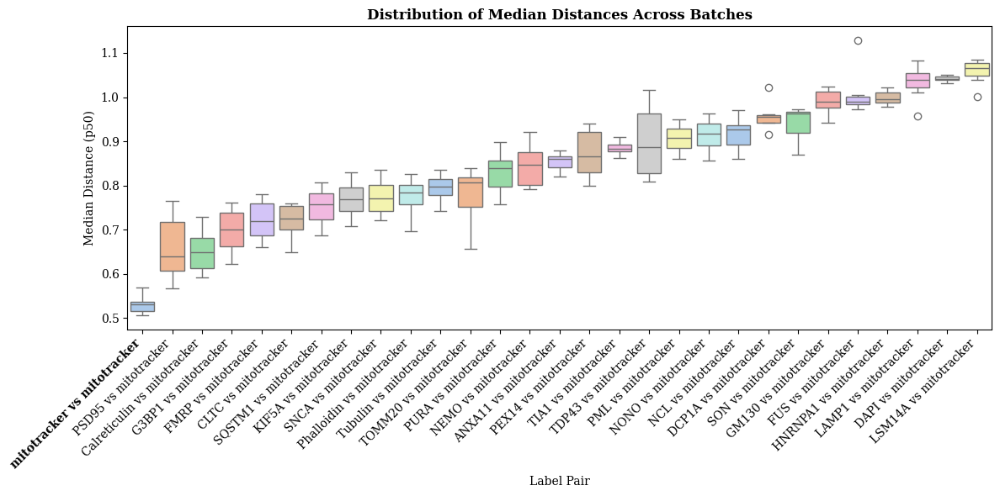

In [48]:
for label in np.unique(labels):
    print('Marker:', label)
    plot_boxplot_all_pairs(merged_df[(merged_df['label1'].str.contains(label))|(merged_df['label2'].str.contains(label))])

### The distances are correlated between batches

# UMAP2

#### I initially saw distances >2 because concatenating several unit‑length embeddings makes the result longer than 1. 

Re‑applying per‑sample L₂ normalization after concatenation restores unit length, ensuring all pairwise Euclidean distances lie in [0, 2].

In [3]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B9_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]

In [129]:
summarize_times(df2)

Max dist_time_s:   0.061s
Total dist_time_s: 0.192s
Mean dist_time_s: 0.007s
Max stats_time_s:  0.047s
Total stats_time_s:0.094s
Mean stats_time: 0.003s


In [130]:
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
27,WT,WT,0.565994
0,FUSHeterozygous,FUSHeterozygous,0.567237
7,FUSHomozygous,FUSHomozygous,0.571463
1,FUSHeterozygous,FUSHomozygous,0.578597
25,TDP43,TDP43,0.583789
13,FUSRevertant,FUSRevertant,0.585124
18,OPTN,OPTN,0.585979
17,FUSRevertant,WT,0.590413
22,TBK1,TBK1,0.592025
23,TBK1,TDP43,0.593684


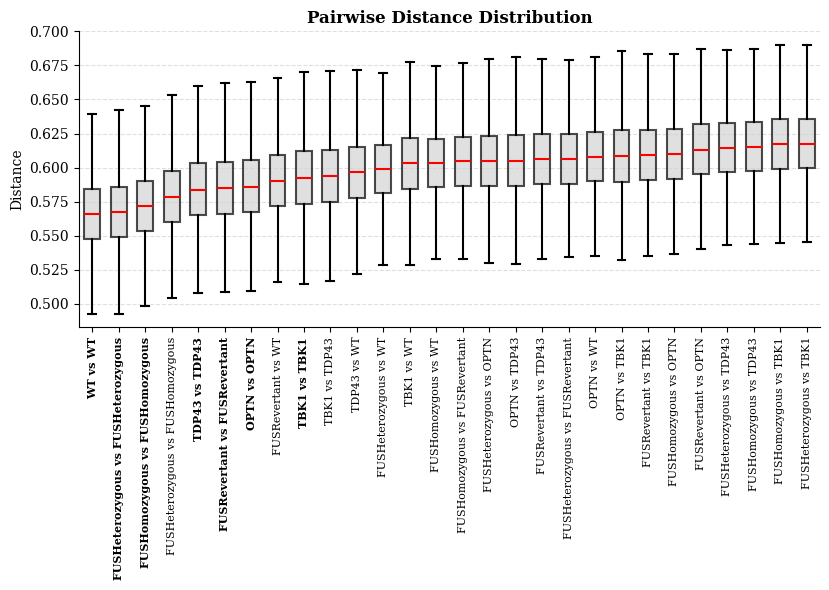

In [131]:
plot_custom_boxplot(df2)

### Is there a difference with / without L2 normalization?

In [133]:
df21 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B9_euclidean_detailed:True_not_normalized.csv')
for col in ['label1','label2']:
    df21[col] = df21[col].str.split(pat='_', n=1).str[0]

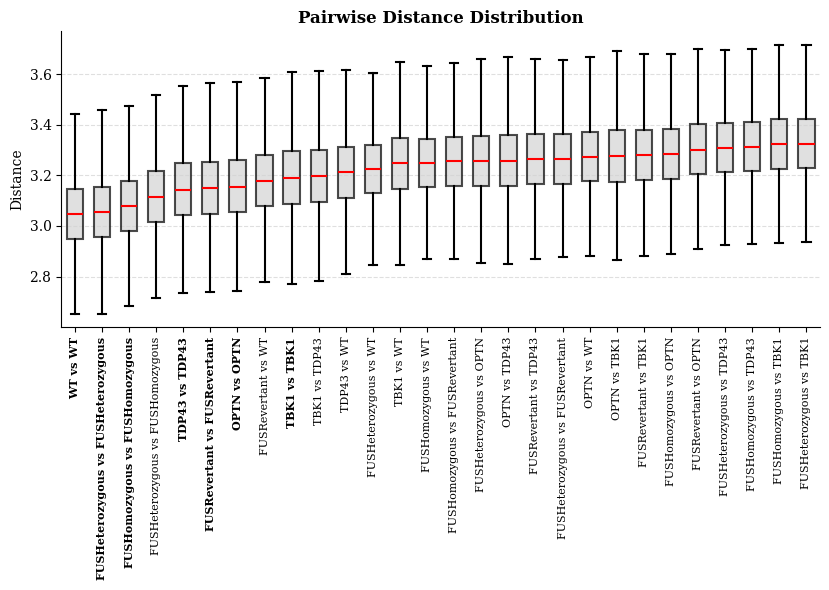

In [136]:
plot_custom_boxplot(df21)

In [138]:
corr = df21['p50'].corr(df2['p50'])
print(corr)

0.9999999998979464


In [146]:
(df21['p50'] - df2['p50']).values

array([2.4874258 , 2.53724295, 2.65835798, 2.65118074, 2.70794129,
       2.69534588, 2.62619853, 2.50595671, 2.65095109, 2.67388564,
       2.70621449, 2.69881535, 2.64619017, 2.56586331, 2.68873096,
       2.67021579, 2.65725309, 2.58905828, 2.56961119, 2.66808558,
       2.65265036, 2.66479182, 2.59612715, 2.60340238, 2.64431888,
       2.56000942, 2.6154772 , 2.4819786 ])

In [141]:
df2.sort_values('p50').index, df21.sort_values('p50').index, 

(Index([27,  0,  7,  1, 25, 13, 18, 17, 22, 23, 26,  6, 24, 12,  8,  3, 20, 16,
         2, 21, 19, 15,  9, 14,  5, 11, 10,  4],
       dtype='int64'),
 Index([27,  0,  7,  1, 25, 13, 18, 17, 22, 23, 26,  6, 24, 12,  8,  3, 20, 16,
         2, 21, 19, 15,  9, 14,  5, 11, 10,  4],
       dtype='int64'))

Marker: FUSHeterozygous


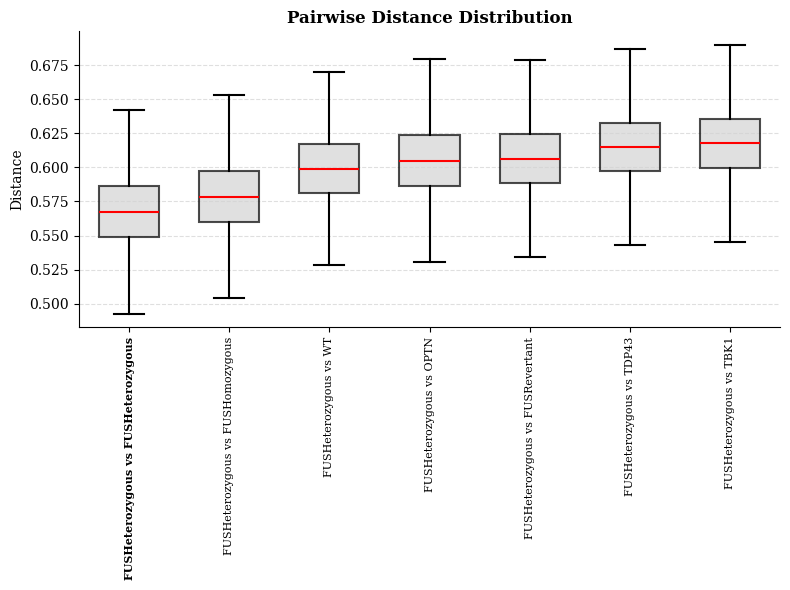

Marker: FUSHomozygous


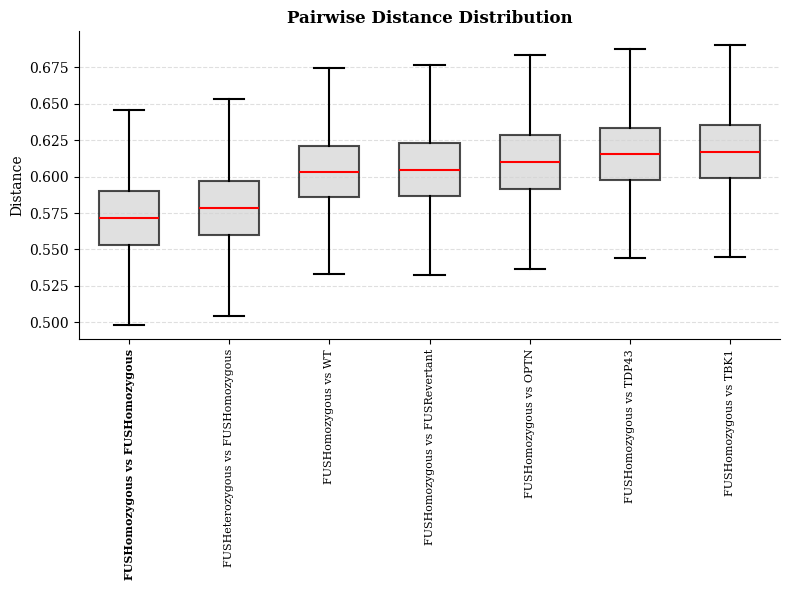

Marker: FUSRevertant


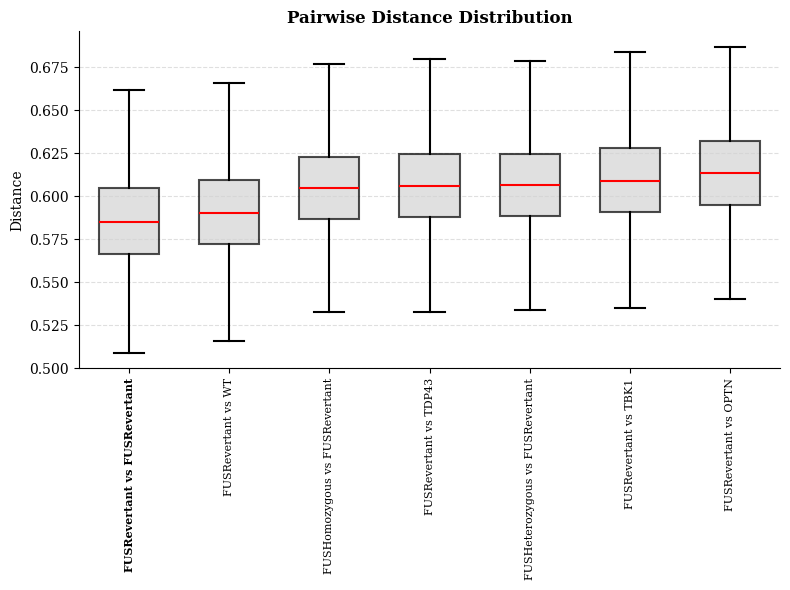

Marker: OPTN


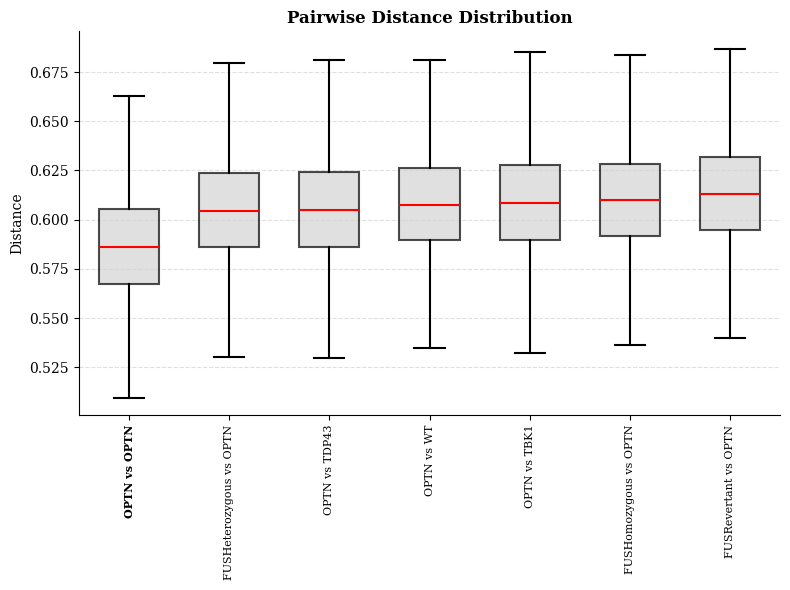

Marker: TBK1


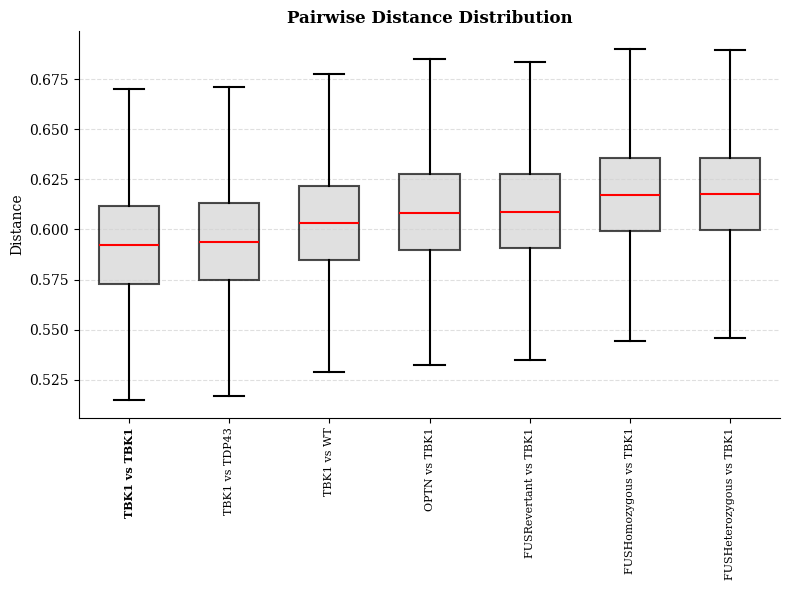

Marker: TDP43


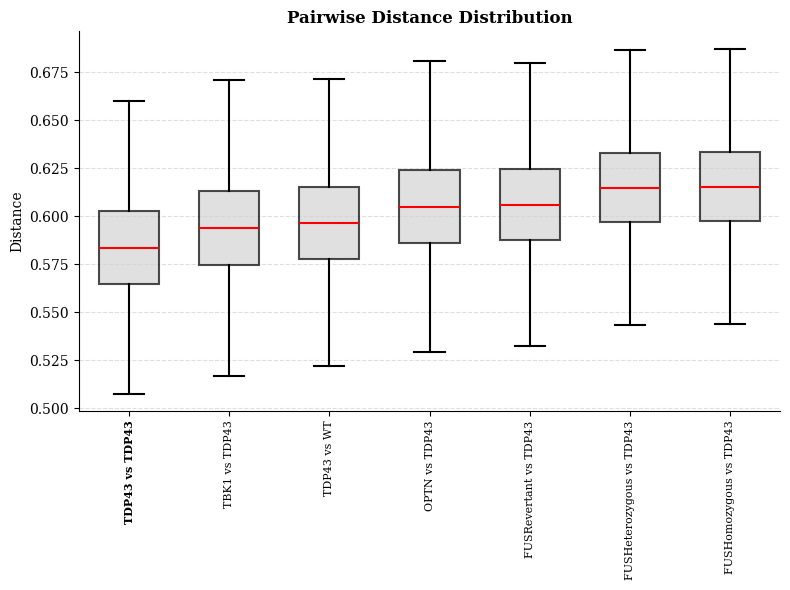

Marker: WT


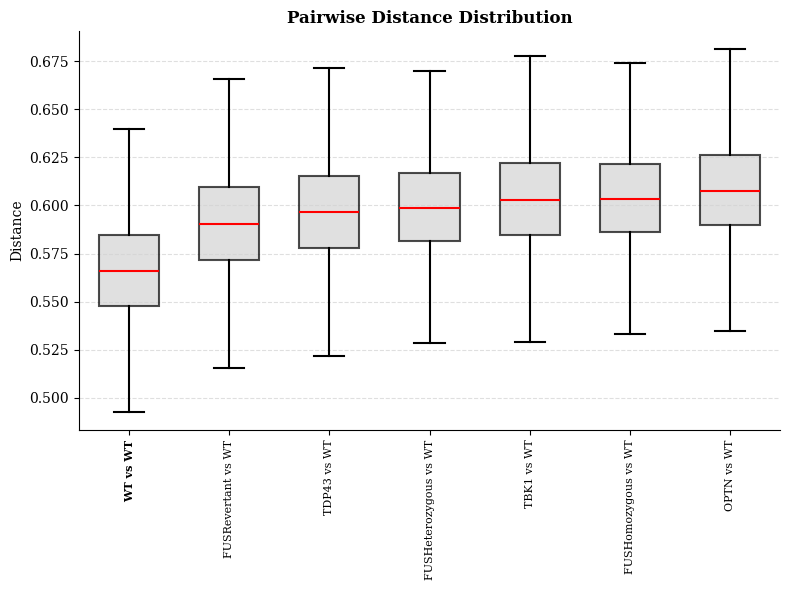

In [228]:
for label in np.unique(df2[['label1', 'label2']].values.ravel()):
    print('Marker:', label)
    plot_custom_boxplot(df2[(df2['label1'].str.contains(label))|(df2['label2'].str.contains(label))])

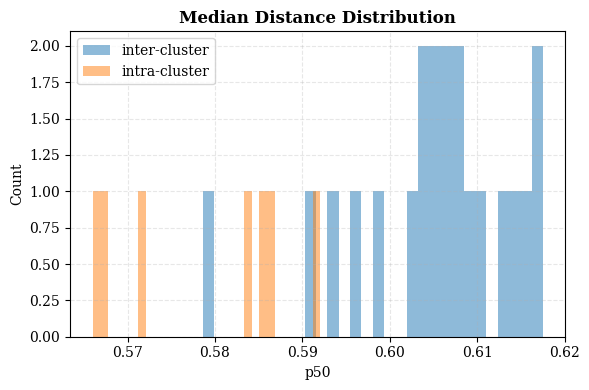

In [126]:
plot_dist_histogram(df2)

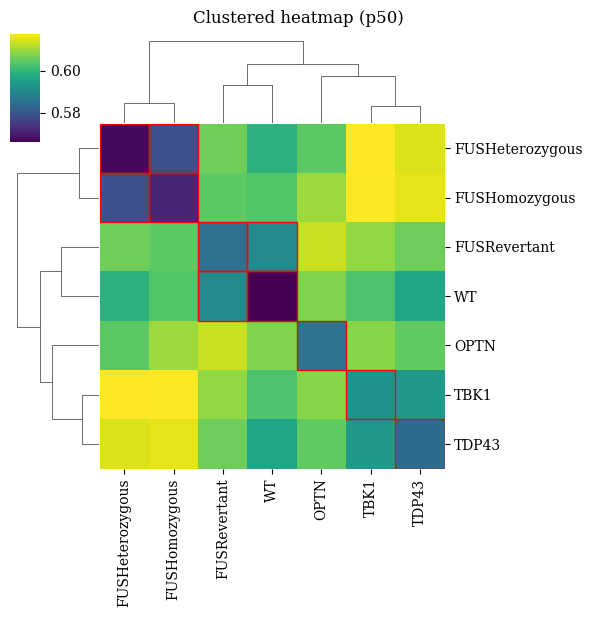

In [127]:
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())

In [214]:
## Optional: Stretch the scale for visualization
df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)

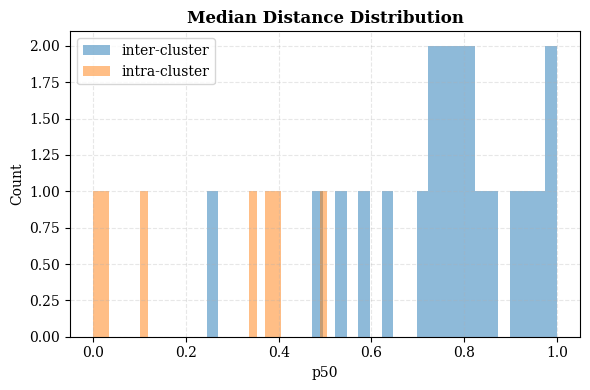

In [215]:
plot_dist_histogram(df2)

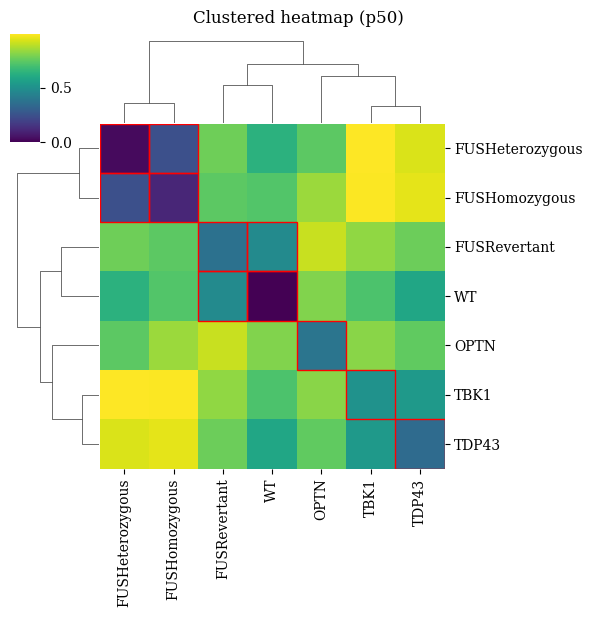

In [216]:
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())

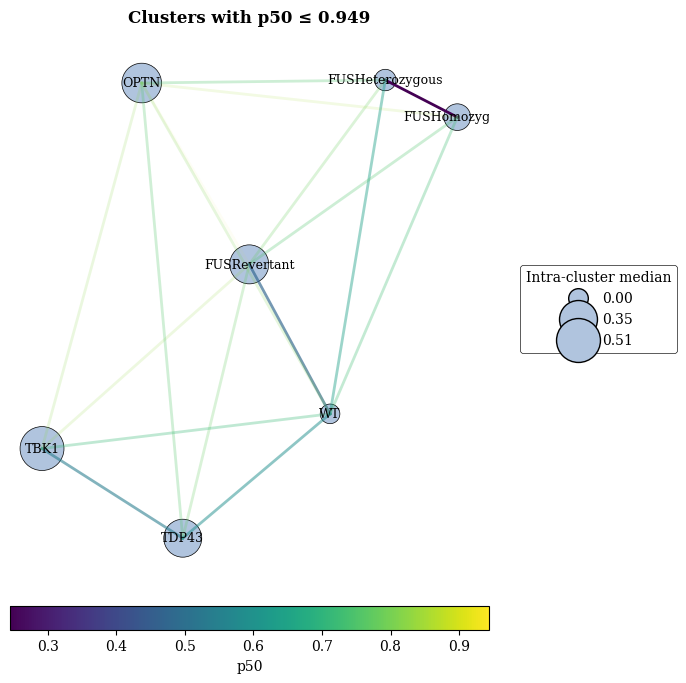

In [220]:
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

kamada


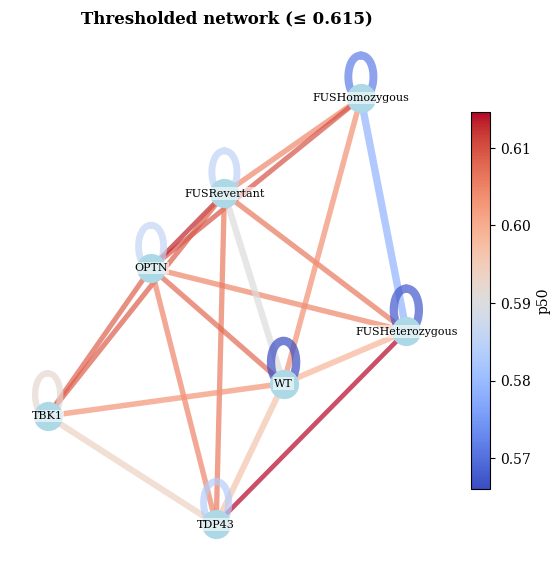

In [239]:
## Another graph representation
plot_network1(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7), method = 'k')

In [4]:
batches = range(1,11)

dfs, names = [], []
for b in batches:
    path = (
        f"output_distances/"
        f"label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B{b}_euclidean_detailed:True.csv"
    )
    try:
        df = pd.read_csv(path)
        # strip the "_WT_Untreated" (or everything after first "_")
        for col in ("label1","label2"):
            df[col] = df[col].str.split(pat='_', n=1).str[0]
        dfs.append(df)
        names.append(f"batch{b}")
    except:
        print('batch', b, 'doesnt exists')
merged_df, cols = merge_batches_by_key(dfs, names) 

batch 4 doesnt exists
batch 5 doesnt exists
batch 6 doesnt exists


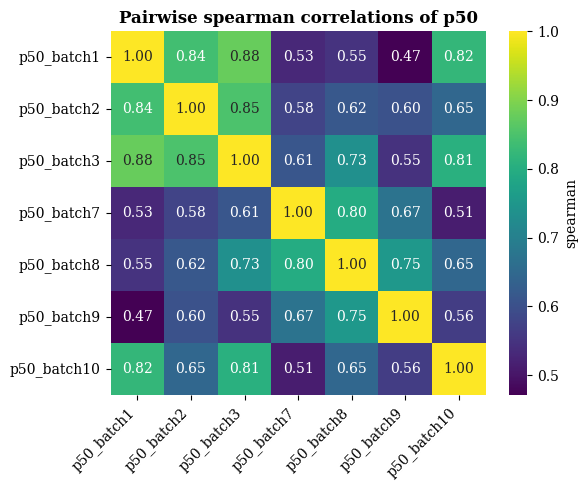

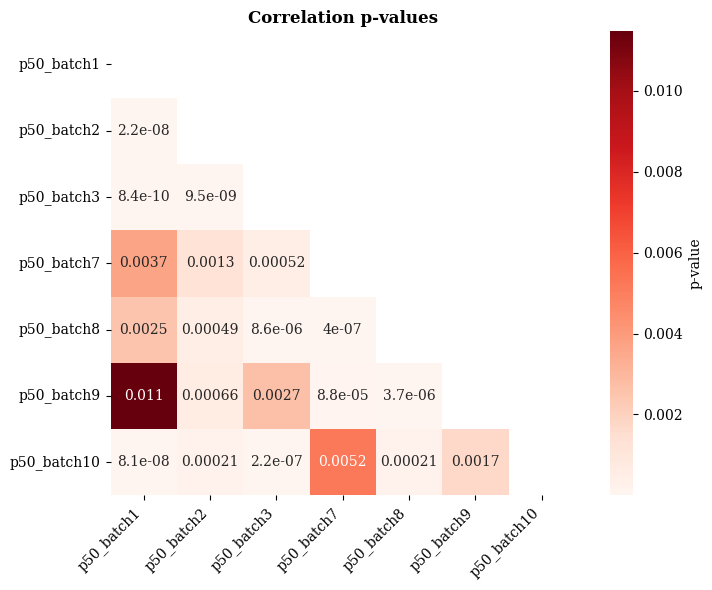

In [120]:
# 1) heatmap of correlations

method = 'spearman'
corr_df, pval_df = correlate_columns(merged_df, cols, method=method)
plot_correlation_heatmap(corr_df, method=method)
plot_pval_heatmap(pval_df, labels=cols)

In [13]:
## Sanity check
from scipy.stats import spearmanr

x1 = merged_df['p50_batch1'].values
x2 = merged_df['p50_batch2'].values
corr, pval = spearmanr(x1, x2)
print("Spearman correlation:", corr)
print("p-value:", pval)

Spearman correlation: 0.840175150519978
p-value: 2.2397505648403477e-08


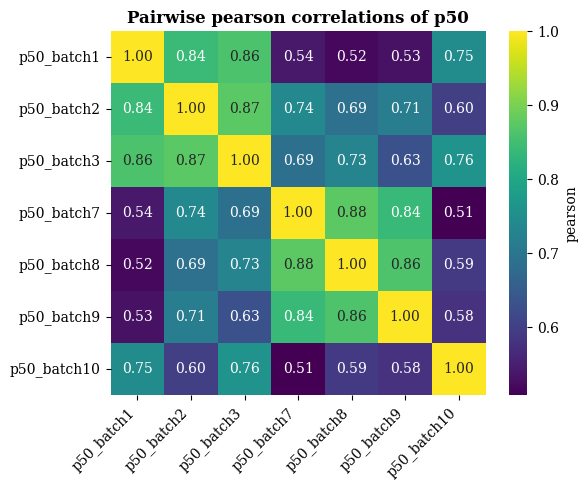

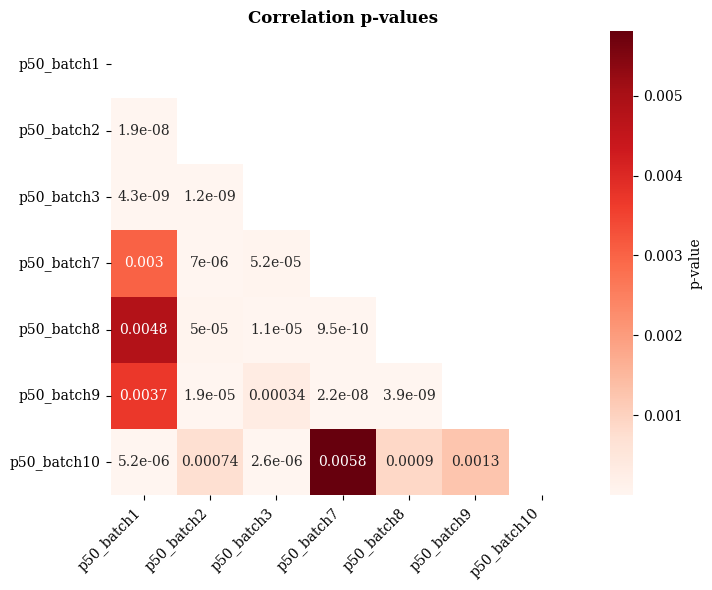

In [121]:
method = 'pearson'
corr_df, pval_df = correlate_columns(merged_df, cols, method=method)
plot_correlation_heatmap(corr_df, method=method)
plot_pval_heatmap(pval_df, labels=cols)

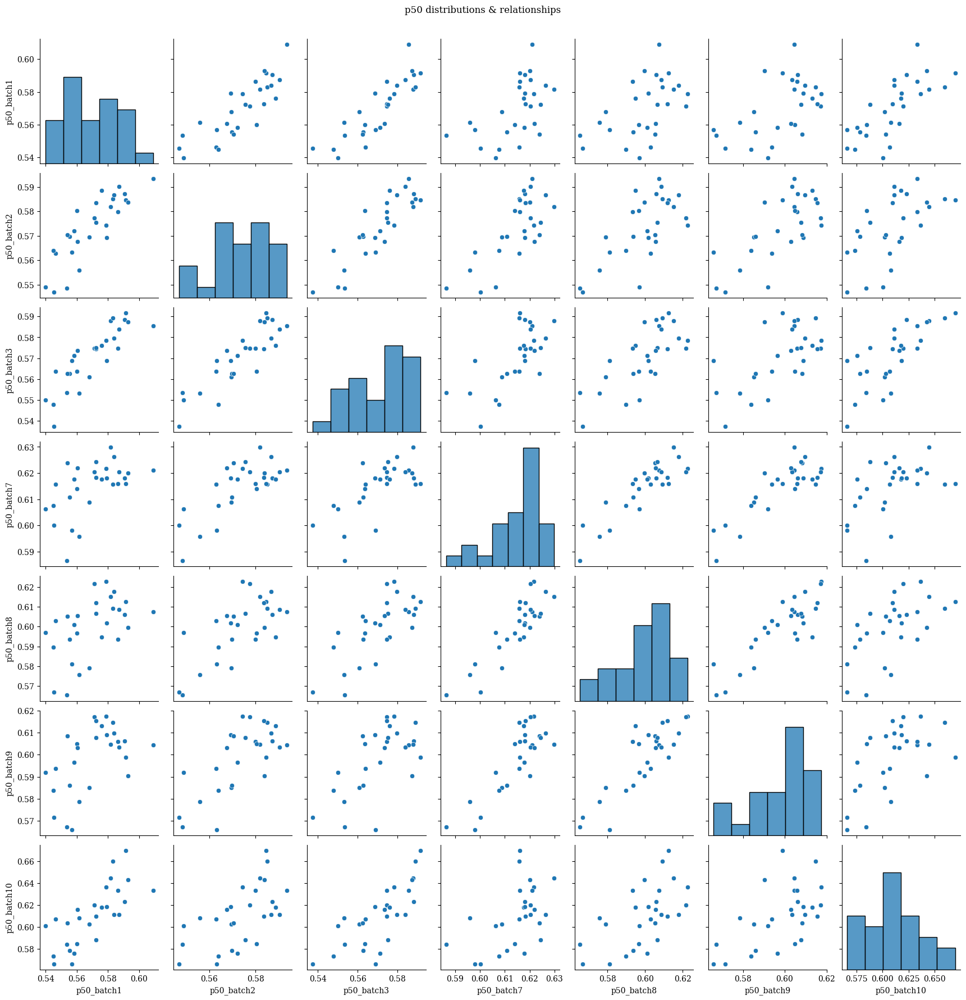

In [108]:
# 2) pairplot of the p50 columns
sns.pairplot(merged_df[[f"p50_{n}" for n in names]])
plt.suptitle("p50 distributions & relationships", y=1.02)
plt.show()

#### Batches 1,2,3,10 are correlated
#### Batches 7,8,9 are correlated

### How does normalization effect the correlations?

In [109]:
batches = range(1,11)

dfs, names = [], []
for b in batches:
    path = (
        f"output_distances/"
        f"label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B{b}_euclidean_detailed:True.csv"
    )
    try:
        df = pd.read_csv(path)
        # strip the "_WT_Untreated" (or everything after first "_")
        for col in ("label1","label2"):
            df[col] = df[col].str.split(pat='_', n=1).str[0]
            df['p50'] = (df['p50'] - df['p50'].min()) / (df['p50'].max() - df['p50'].min() + 1e-6)
        dfs.append(df)
        names.append(f"batch{b}")
    except:
        print('batch', b, 'doesnt exists')
merged_df, cols = merge_batches_by_key(dfs, names) 

batch 4 doesnt exists
batch 5 doesnt exists
batch 6 doesnt exists


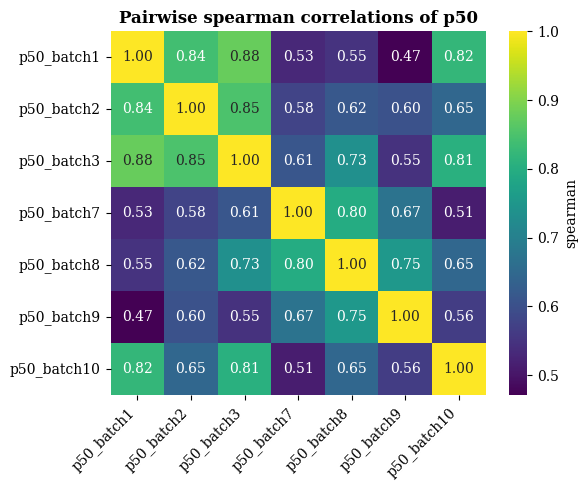

In [110]:
method = 'spearman'
corr_df, pval_df = correlate_columns(merged_df, cols, method=method)
plot_correlation_heatmap(corr_df, method=method)

#### => Correlation metrix remains the same after normalization

### Batch 1

In [50]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B1_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
22,TBK1,TBK1,0.539768
25,TDP43,TDP43,0.544963
7,FUSHomozygous,FUSHomozygous,0.545445
23,TBK1,TDP43,0.546216
0,FUSHeterozygous,FUSHeterozygous,0.553542
19,OPTN,TBK1,0.554136
18,OPTN,OPTN,0.555501
27,WT,WT,0.556918
26,TDP43,WT,0.558402
20,OPTN,TDP43,0.560053


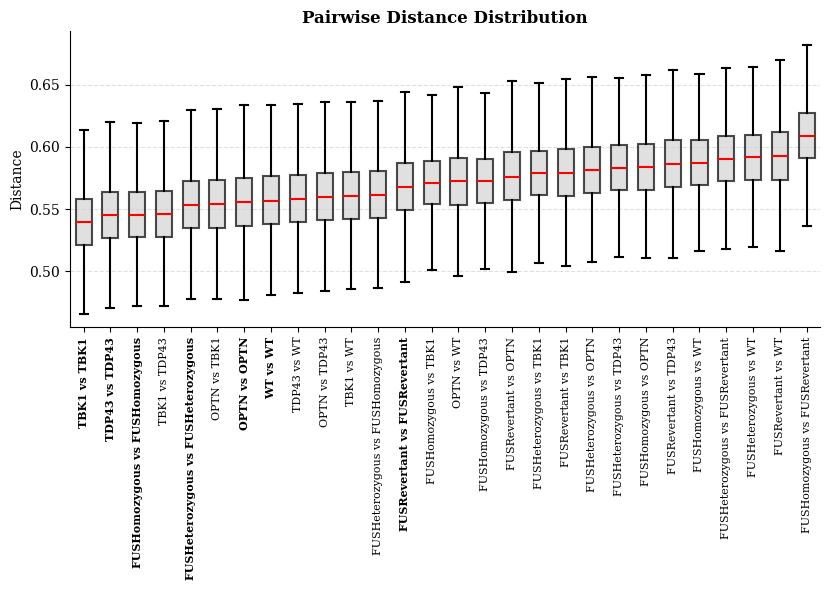

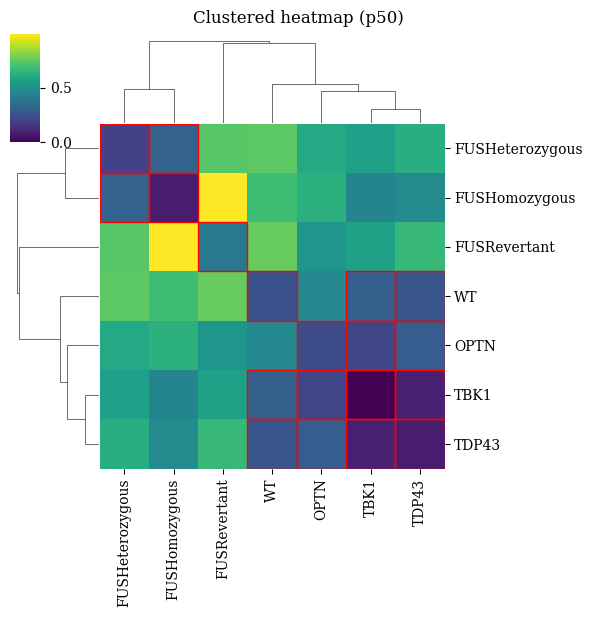

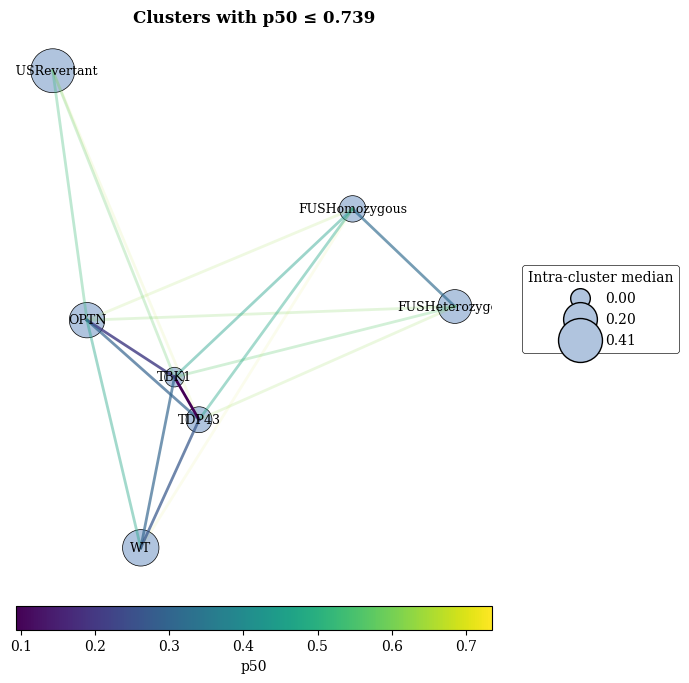

In [261]:
plot_custom_boxplot(df2)
df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

### Batch 2

In [248]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B2_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
7,FUSHomozygous,FUSHomozygous,0.546937
0,FUSHeterozygous,FUSHeterozygous,0.548499
22,TBK1,TBK1,0.548950
1,FUSHeterozygous,FUSHomozygous,0.555976
23,TBK1,TDP43,0.562944
27,WT,WT,0.563283
25,TDP43,TDP43,0.563887
24,TBK1,WT,0.567673
15,FUSRevertant,TBK1,0.569236
13,FUSRevertant,FUSRevertant,0.569553


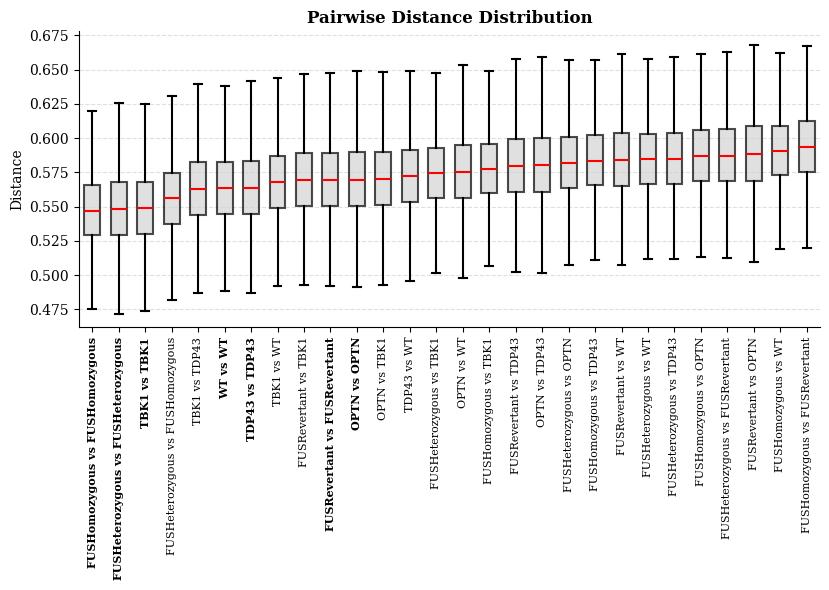

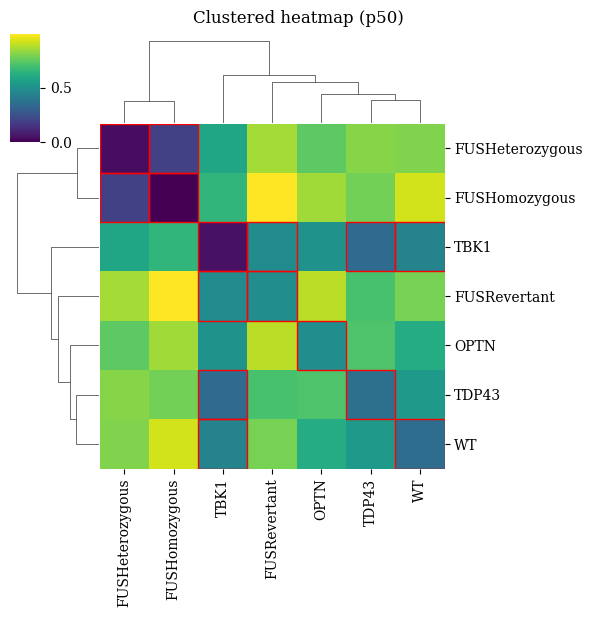

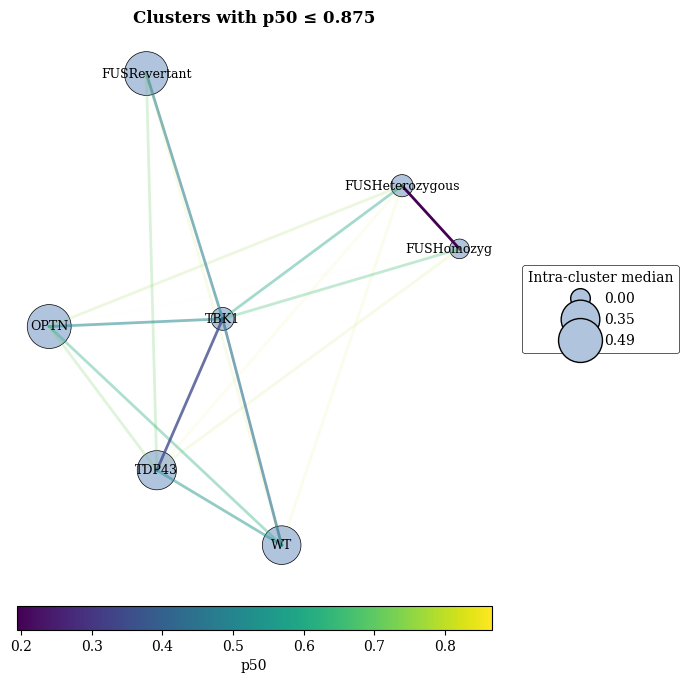

In [249]:
plot_custom_boxplot(df2)
df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

### Batch 3

In [250]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B3_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
7,FUSHomozygous,FUSHomozygous,0.537325
25,TDP43,TDP43,0.547847
22,TBK1,TBK1,0.550113
1,FUSHeterozygous,FUSHomozygous,0.553182
0,FUSHeterozygous,FUSHeterozygous,0.553599
13,FUSRevertant,FUSRevertant,0.560934
19,OPTN,TBK1,0.562634
18,OPTN,OPTN,0.562660
20,OPTN,TDP43,0.563746
23,TBK1,TDP43,0.563829


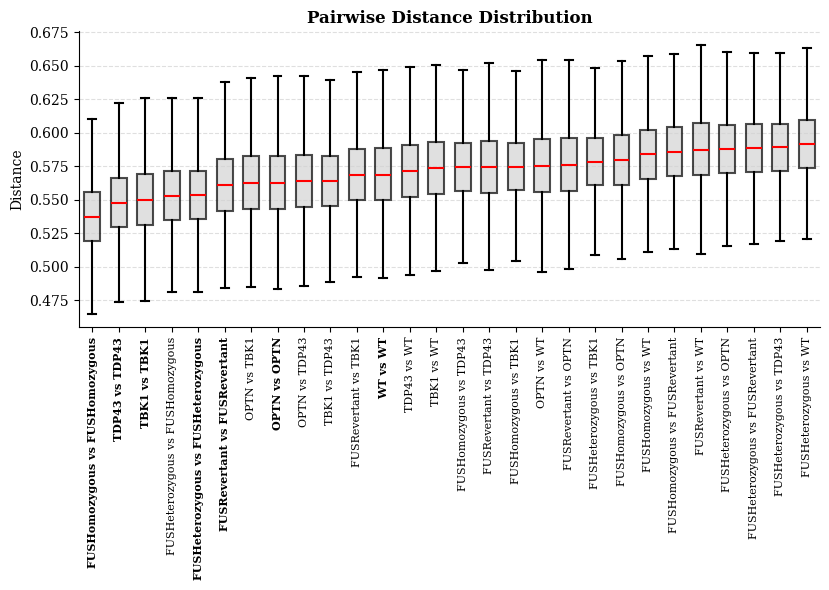

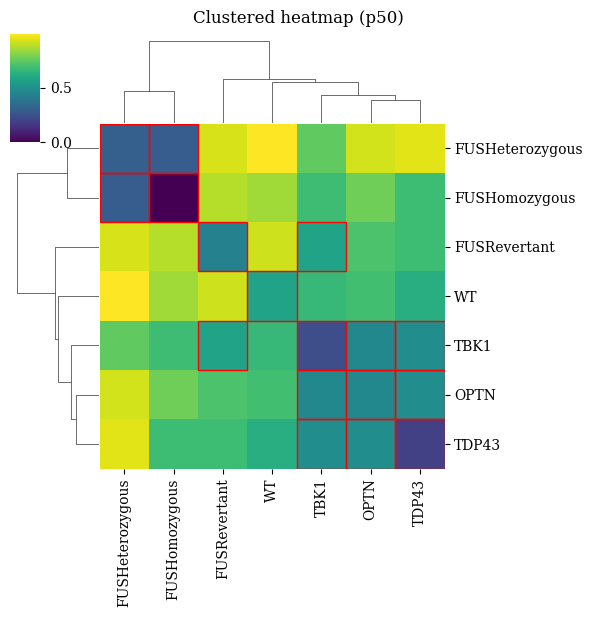

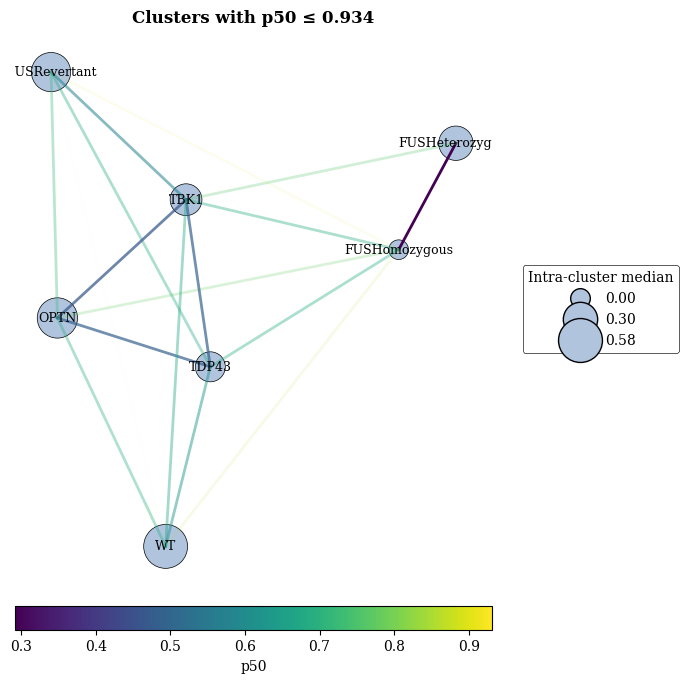

In [251]:
plot_custom_boxplot(df2)
df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

### Batch 7

In [256]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B7_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
0,FUSHeterozygous,FUSHeterozygous,0.586453
1,FUSHeterozygous,FUSHomozygous,0.595821
27,WT,WT,0.598045
7,FUSHomozygous,FUSHomozygous,0.600153
22,TBK1,TBK1,0.606335
25,TDP43,TDP43,0.607592
13,FUSRevertant,FUSRevertant,0.608848
18,OPTN,OPTN,0.610792
20,OPTN,TDP43,0.614007
5,FUSHeterozygous,TDP43,0.615811


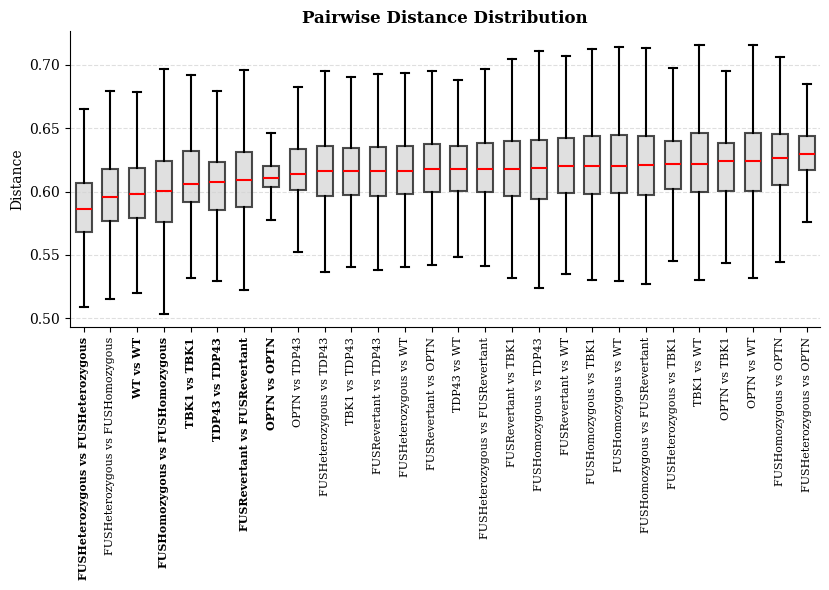

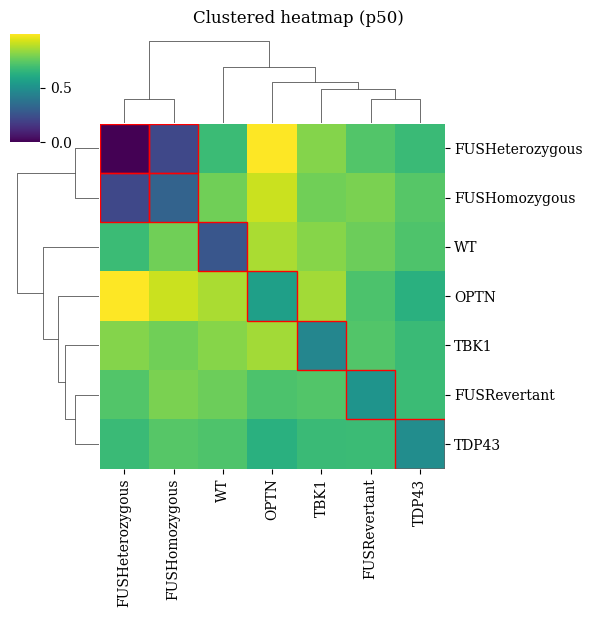

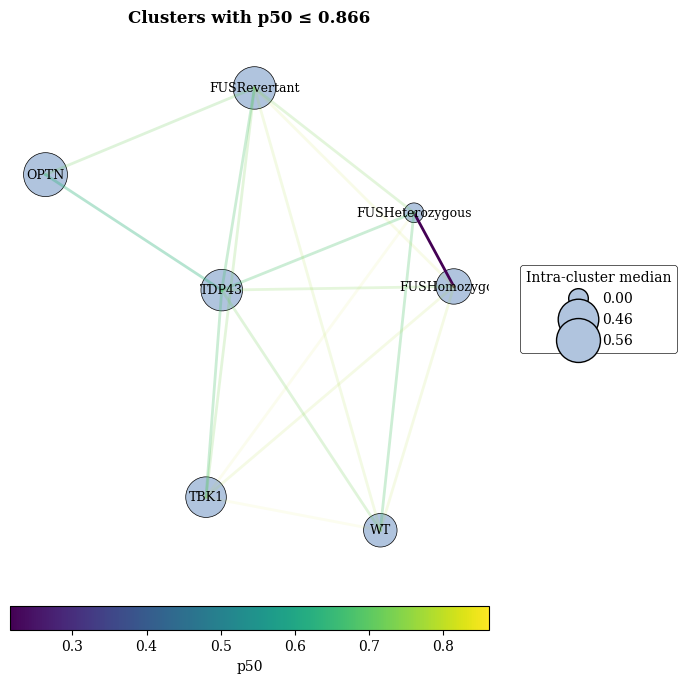

In [257]:
plot_custom_boxplot(df2)
df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

### Batch 8

In [258]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B8_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
0,FUSHeterozygous,FUSHeterozygous,0.565329
7,FUSHomozygous,FUSHomozygous,0.566815
1,FUSHeterozygous,FUSHomozygous,0.575664
13,FUSRevertant,FUSRevertant,0.578966
27,WT,WT,0.581016
25,TDP43,TDP43,0.589651
16,FUSRevertant,TDP43,0.593431
18,OPTN,OPTN,0.593571
14,FUSRevertant,OPTN,0.594822
20,OPTN,TDP43,0.596580


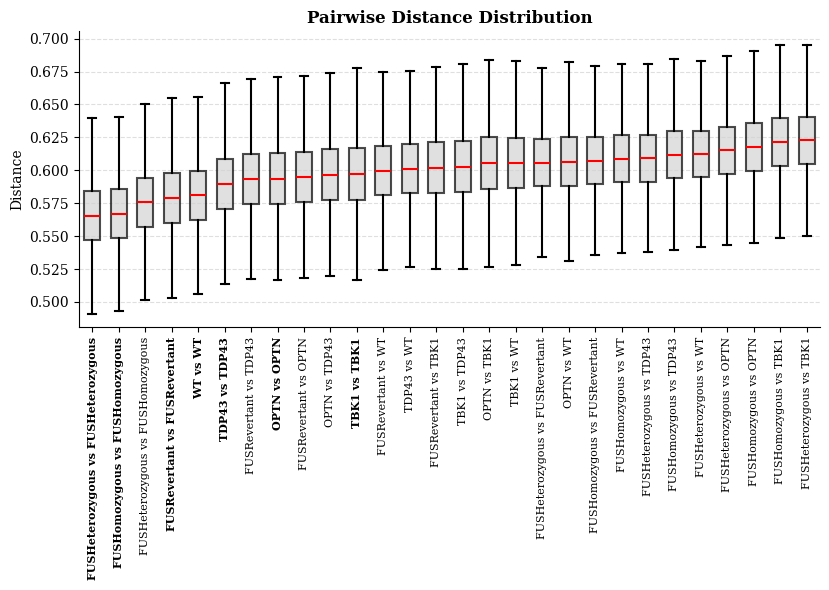

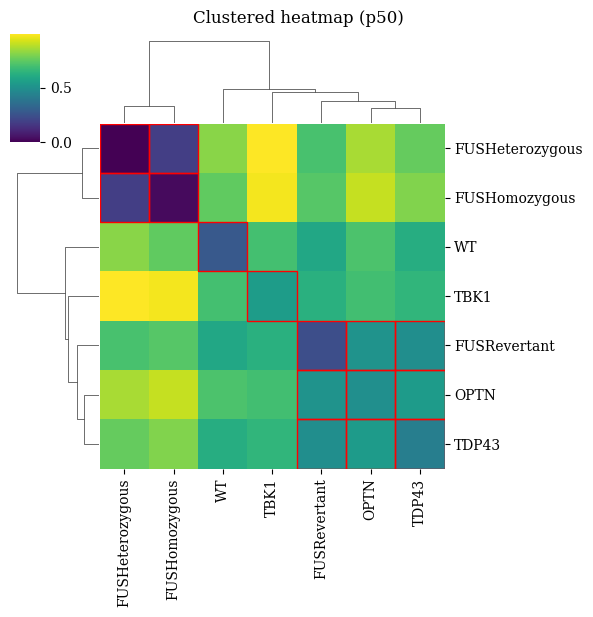

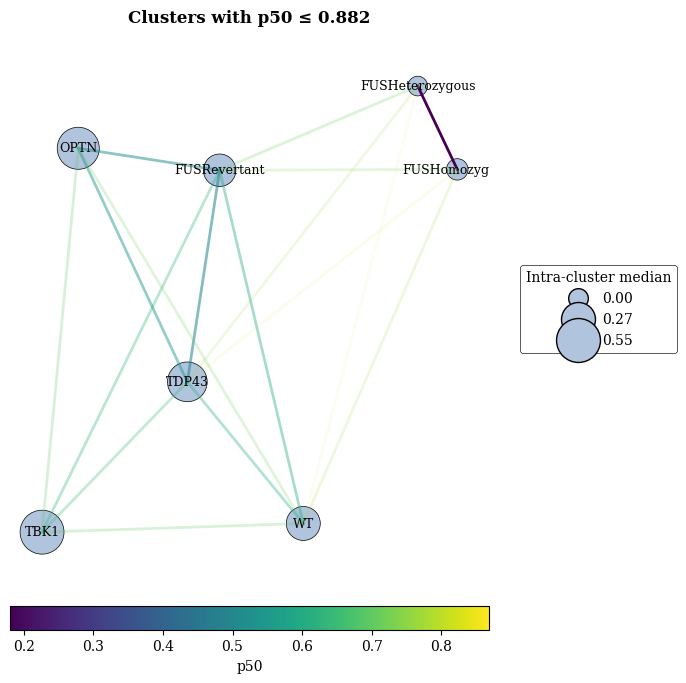

In [259]:
plot_custom_boxplot(df2)
df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

### Batch 10

In [266]:
df2 = pd.read_csv('output_distances/label_pair_distances_stats_newNeuronsD8FigureConfig_UMAP2_B10_euclidean_detailed:True.csv')
for col in ['label1','label2']:
    df2[col] = df2[col].str.split(pat='_', n=1).str[0]
df2.sort_values('p50')[['label1', 'label2', 'p50']]

,label1,label2,p50
27,WT,WT,0.566041
7,FUSHomozygous,FUSHomozygous,0.566043
25,TDP43,TDP43,0.573323
26,TDP43,WT,0.575716
18,OPTN,OPTN,0.578197
0,FUSHeterozygous,FUSHeterozygous,0.584005
20,OPTN,TDP43,0.584506
21,OPTN,WT,0.587898
22,TBK1,TBK1,0.600577
13,FUSRevertant,FUSRevertant,0.602216


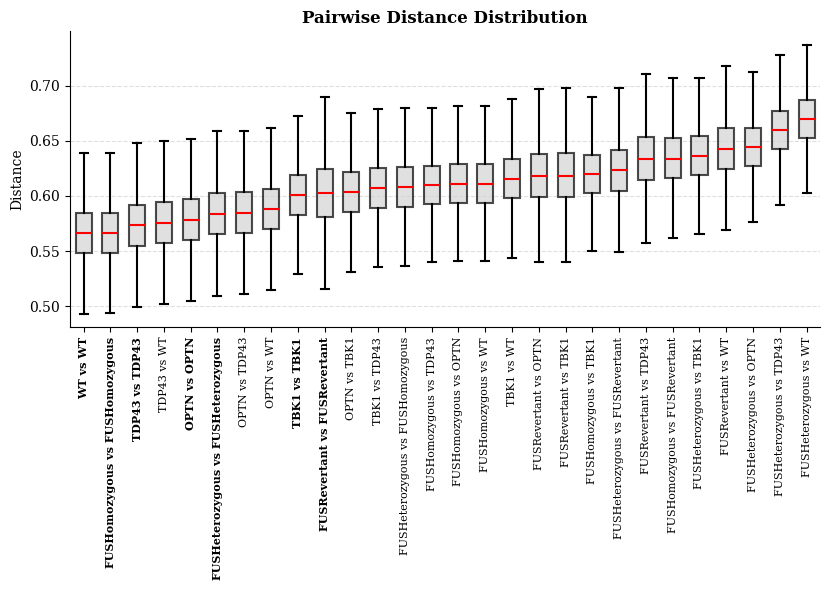

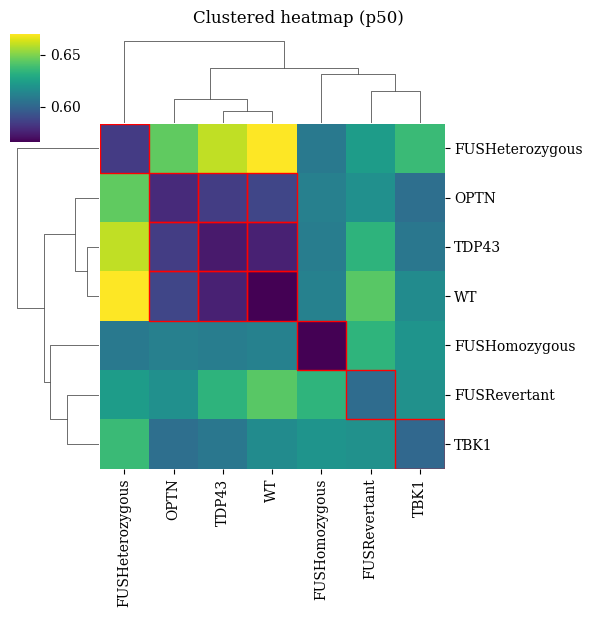

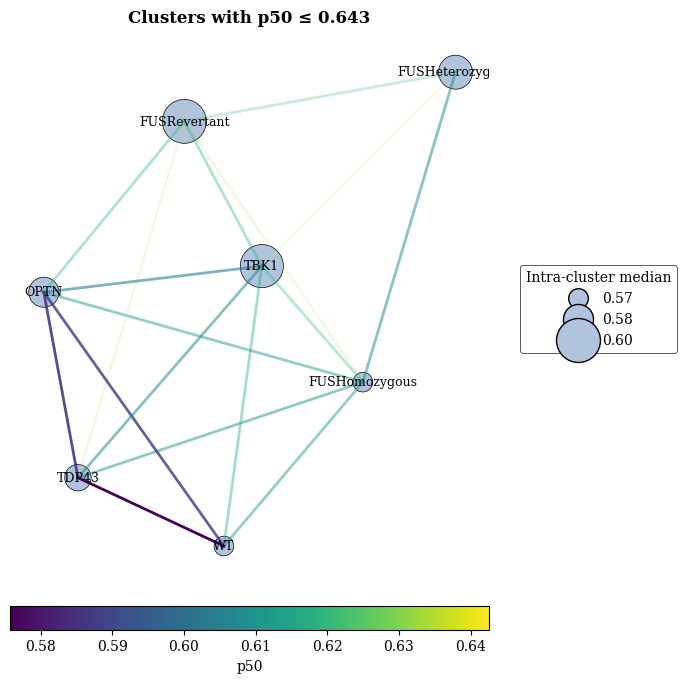

In [267]:
plot_custom_boxplot(df2)
# df2['p50'] = (df2['p50'] - df2['p50'].min()) / (df2['p50'].max() - df2['p50'].min() + 1e-6)
plot_label_clustermap(df2, figsize=(6,6), highlight_thresh=df2[df2.label1 == df2.label2]['p50'].max())
plot_cluster_proximity_network(df2, threshold = df2['p50'].quantile(0.9), figsize=(7,7))

### Compare ditsances across batches

/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:472: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  # Plot
/home/projects/hornsteinlab/Collaboration/NOVA_GAL/NOVA/tools/examine_measures/visualizations.py:480: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  )


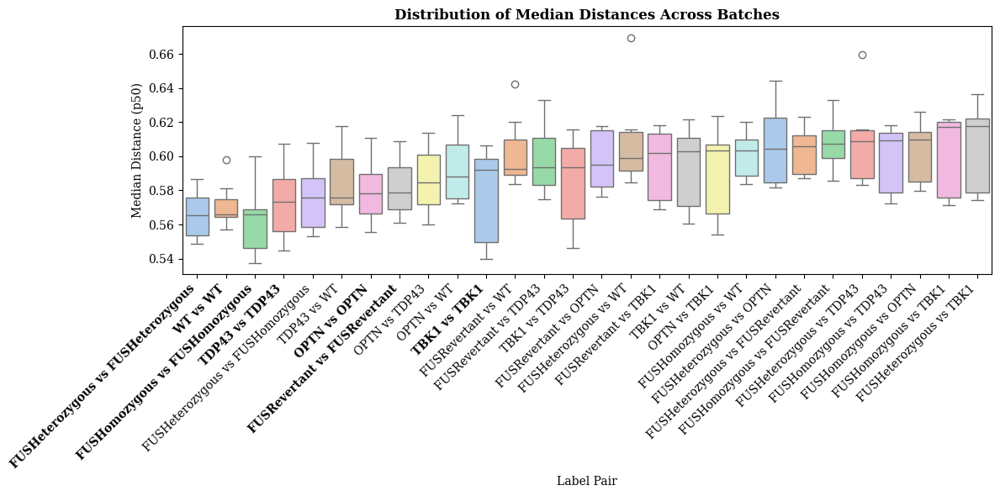

In [44]:
plot_boxplot_all_pairs(merged_df)

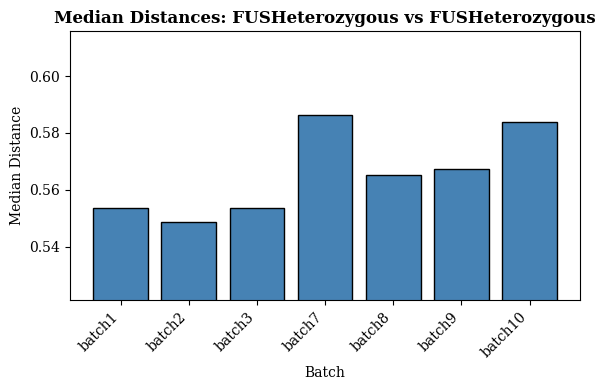

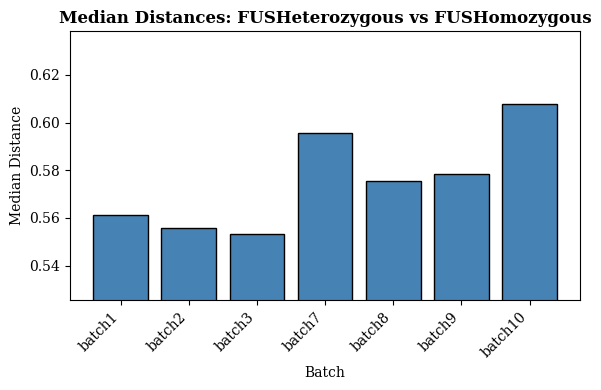

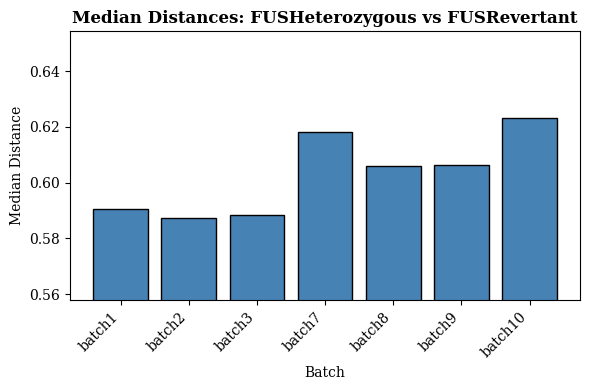

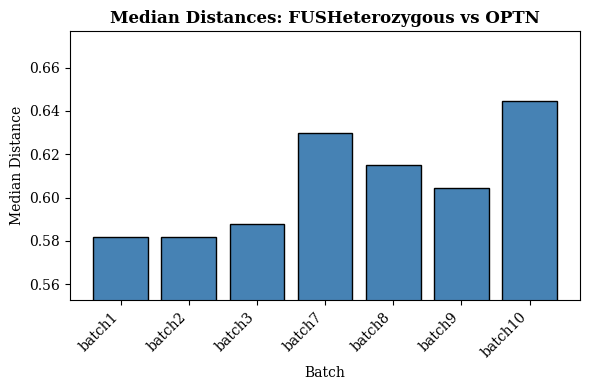

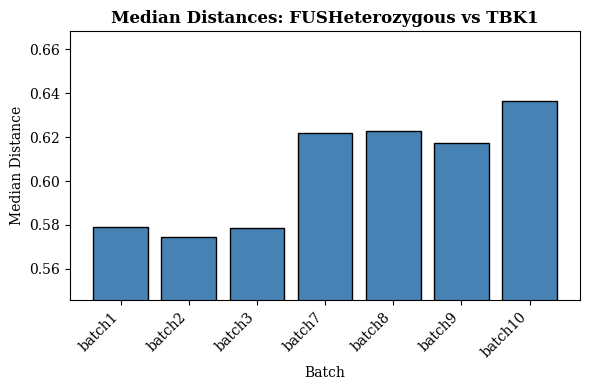

...

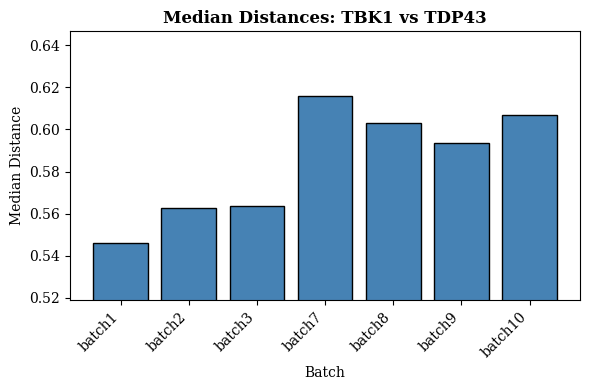

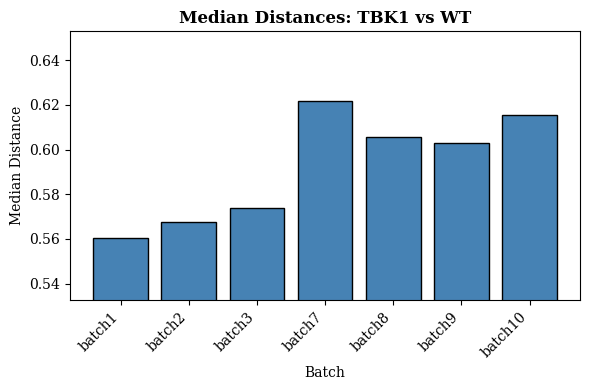

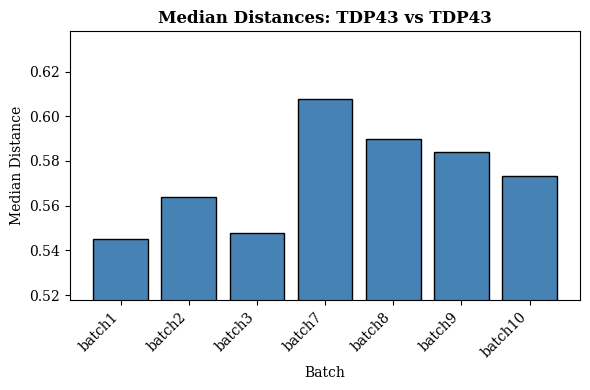

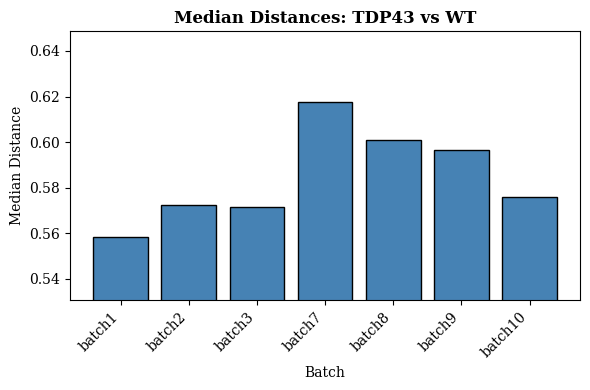

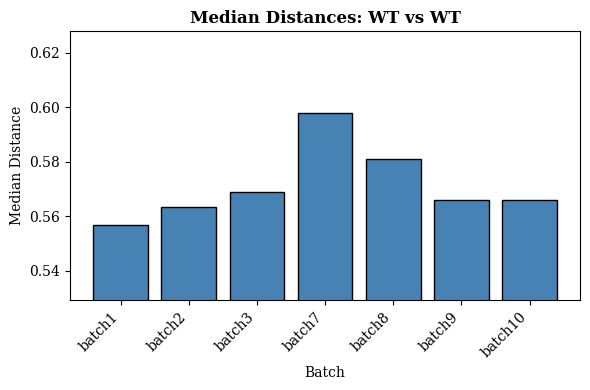

In [35]:
plot_p50_across_batches(merged_df)

### Other measures

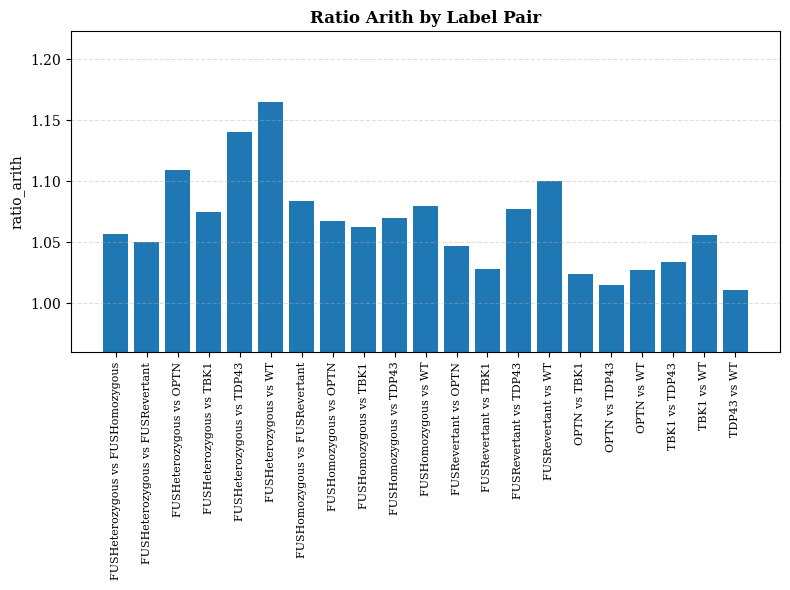

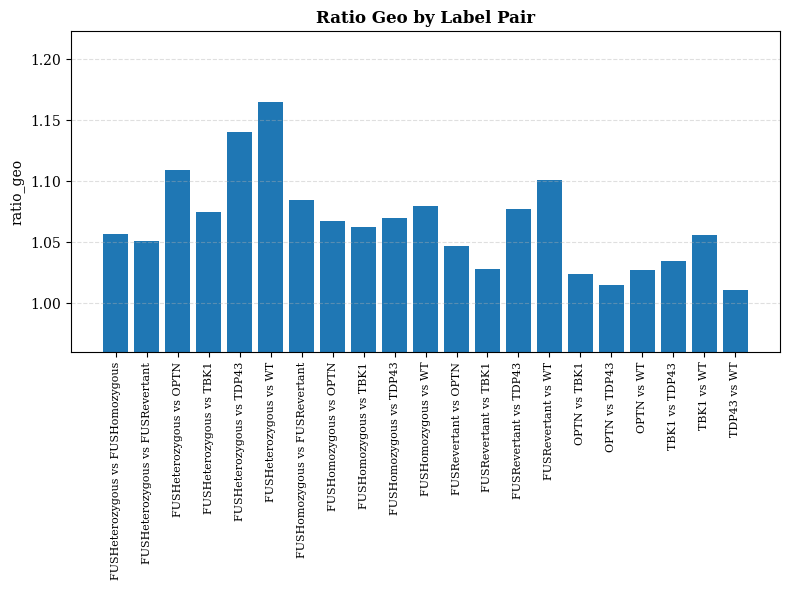

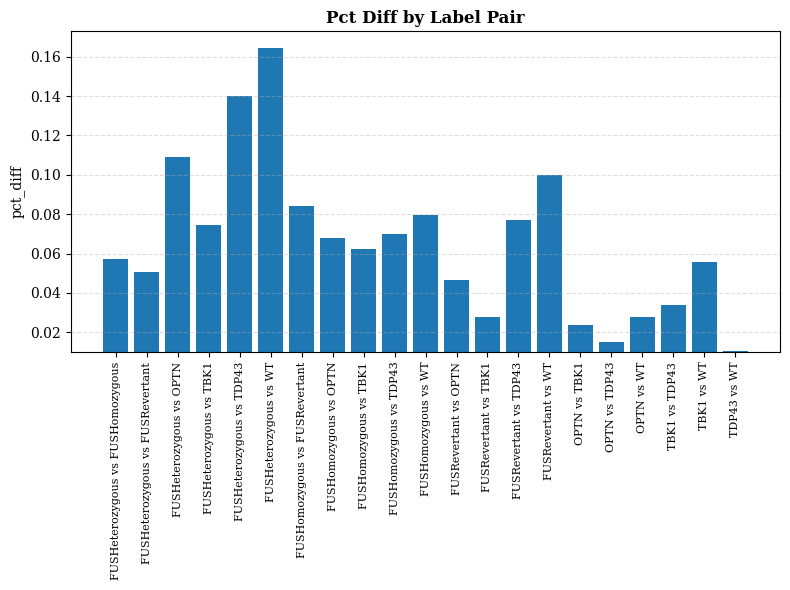

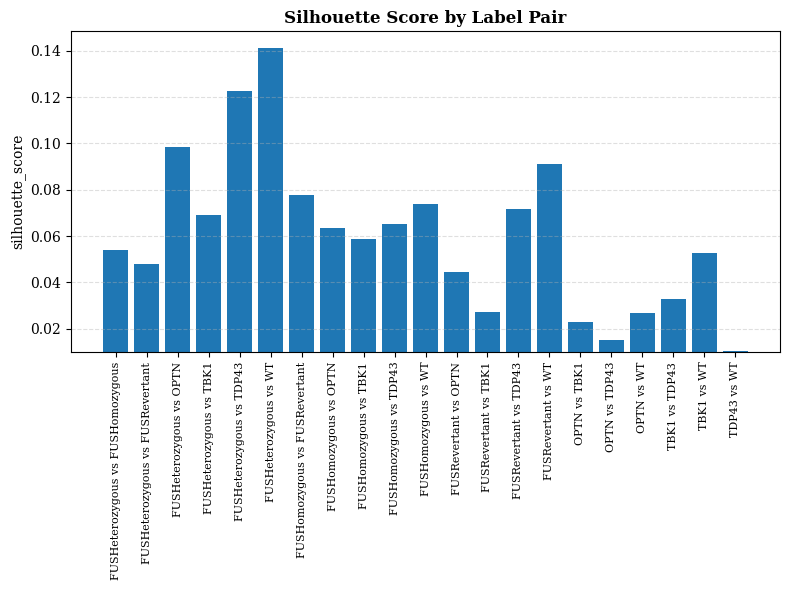

In [269]:
summary_df = df2

# 1. compute intra‑group medians
intra = (
    summary_df
    .loc[summary_df['label1'] == summary_df['label2'], ['label1','p50']]
    .set_index('label1')['p50']
)
summary_df['intra_p50_1'] = summary_df['label1'].map(intra)
summary_df['intra_p50_2'] = summary_df['label2'].map(intra)

# 2. filter to inter‑group pairs
df_inter = summary_df[summary_df['label1'] != summary_df['label2']].copy()

# 3. compute baselines
df_inter['baseline_arith'] = (df_inter['intra_p50_1'] + df_inter['intra_p50_2']) / 2
df_inter['baseline_geo']   = np.sqrt(df_inter['intra_p50_1'] * df_inter['intra_p50_2'])

# 4. compute normalized metrics
d = df_inter['p50']
df_inter['ratio_arith']      = d / df_inter['baseline_arith']
df_inter['ratio_geo']        = d / df_inter['baseline_geo']
df_inter['pct_diff']         = (d - df_inter['baseline_arith']) / df_inter['baseline_arith']
df_inter['silhouette_score'] = (d - df_inter['baseline_arith']) / np.maximum(d, df_inter['baseline_arith'])

# 5. plot each metric as a bar chart
metrics = ['ratio_arith', 'ratio_geo', 'pct_diff', 'silhouette_score']
labels  = df_inter['label1'] + ' vs ' + df_inter['label2']

for m in metrics:
    fig, ax = plt.subplots(figsize=(max(8, len(df_inter)*0.3), 6))
    ax.bar(range(len(df_inter)), df_inter[m])
    ax.set_xticks(range(len(df_inter)))
    ax.set_xticklabels(labels, rotation=90, fontsize=8)
    ax.set_ylabel(m)
    ymin, ymax = df_inter[m].min(), df_inter[m].max()
    ax.set_ylim(ymin*0.95, ymax*1.05)
    ax.set_title(f"{m.replace('_',' ').title()} by Label Pair")
    ax.grid(axis="y", linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()
